# Extract the spectrum of CTIO Data  for HD111980 data 31 may 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne and Jérémy Neveu
- date   : October 21th 2017
- update October 22th 2017


- The goal is to extract the spectrum after the rotation.


-1) First the 1 orders are extracted. One must check the rotation is correct

-2) Check the 2 orders are well aligned along X by looking at the transverse profile : if you see two peaks this means the rotation is bad.

-3) For this the central star light must having been turned off.

In [2]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
print theNotebook

Extract_Spectrum


In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

Extract_Spectrum
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_31may17/HD111980_2


In [5]:
from matplotlib.backends.backend_pdf import PdfPages

In [6]:
import pandas as pd

## Flag to activate saving images in PDF files

In [7]:
PRINT_ONEORDER_PDF=False

# Initialization

## Input Directory

In [8]:
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=74
MAX_IMGNUMBER=108
date="20170531"
object_name='HD111980'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

In [9]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

# Open files

## Find where is order 0 in original raw image

- necessary for wavelength calibration

In [10]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [11]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [12]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.573138,828.229602,563.336487
1,1,-0.795625,827.376519,565.081796
2,2,-0.966543,826.379751,564.157762
3,3,-1.929010,825.513989,563.989613
4,4,-1.632155,822.342548,564.266414


## Find where is order 0 in the rotated image

In [13]:
df2=pd.read_csv('x_y_guess2.csv')
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]
order0_positions2 = np.array([x_star2,y_star2]).T

In [14]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.573138,830.240529,208.377300
1,1,-0.795625,829.882747,211.358899
2,2,-0.966543,829.428848,213.846280
3,3,-1.929010,831.636281,228.853959
4,4,-1.632155,827.909538,223.541250


## Open Fits images

In [15]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)
print all_images[0].shape

Number of images: 35
(400, 2048)


In [16]:
print all_filt

['RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg']


## Disperser sorting

In [17]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [18]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  [ 0  5 10 15 20 25 30]
dia Thor300  	 : filt1_idx ::  [ 1  6 11 16 21 26 31]
dia HoloPhP  	 : filt2_idx ::  [ 2  7 12 17 22 27 32]
dia HoloPhAg  	 : filt3_idx ::  [ 3  8 13 18 23 28 33]
dia HoloAmAg  	 : filt4_idx ::  [ 4  9 14 19 24 29 34]
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


In [19]:
#all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


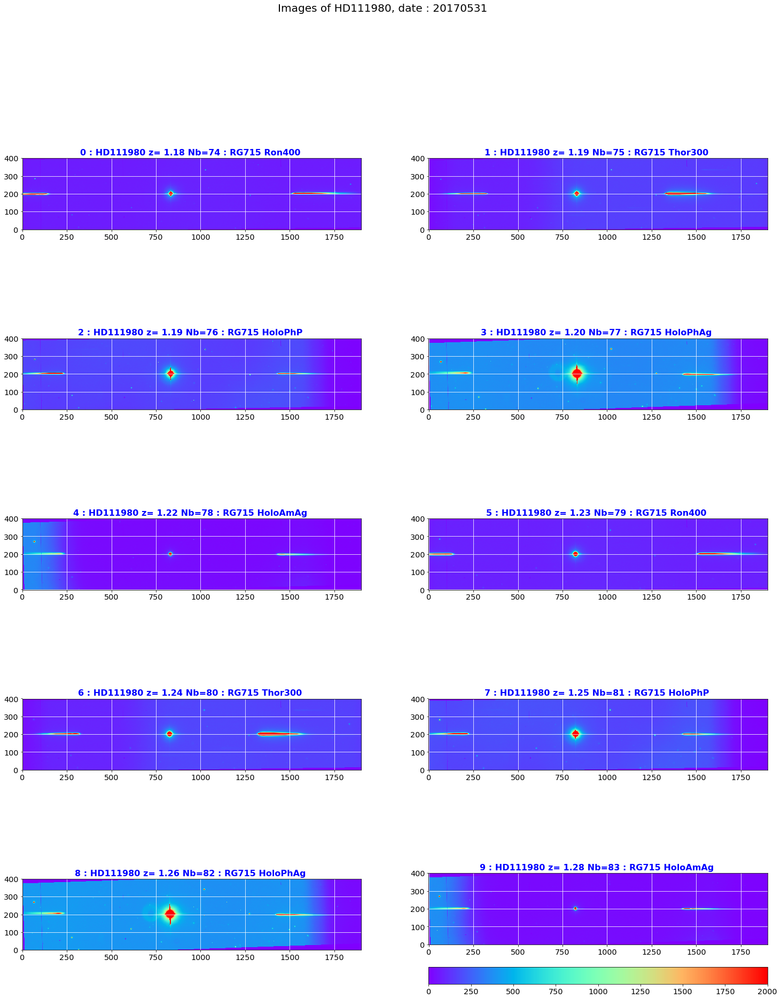

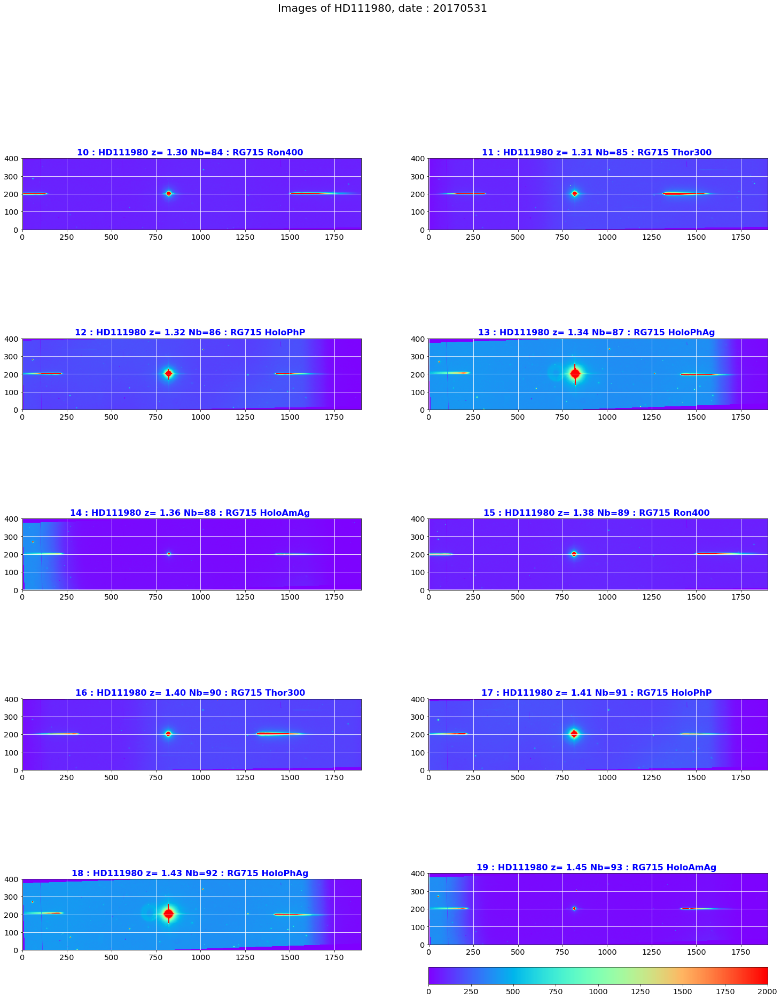

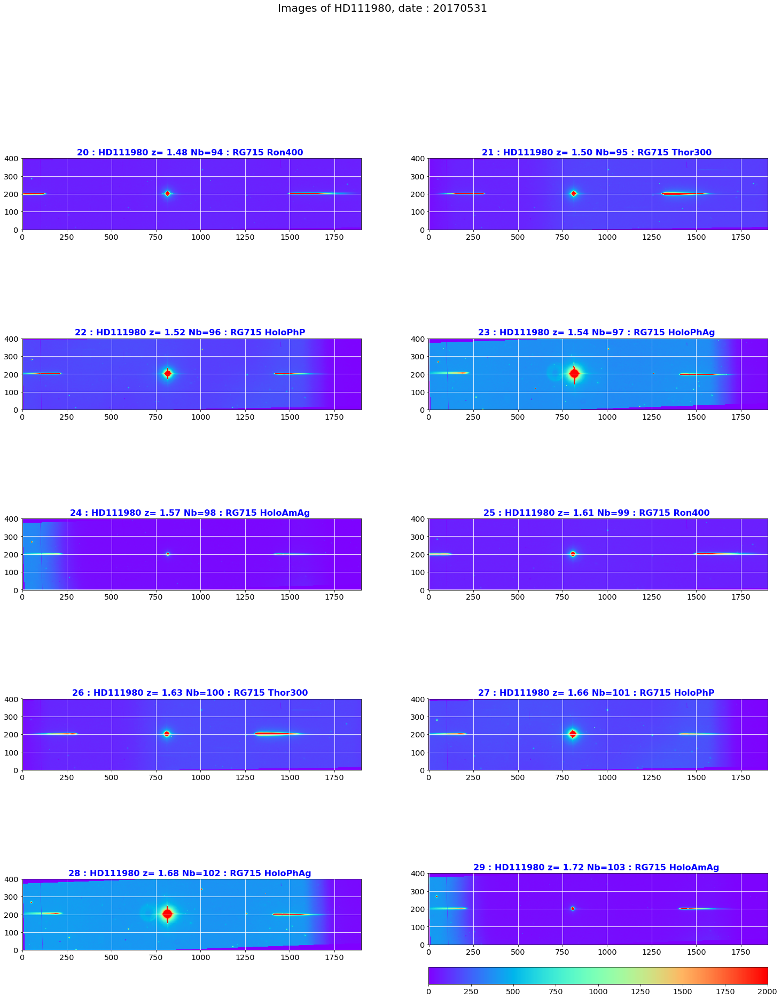

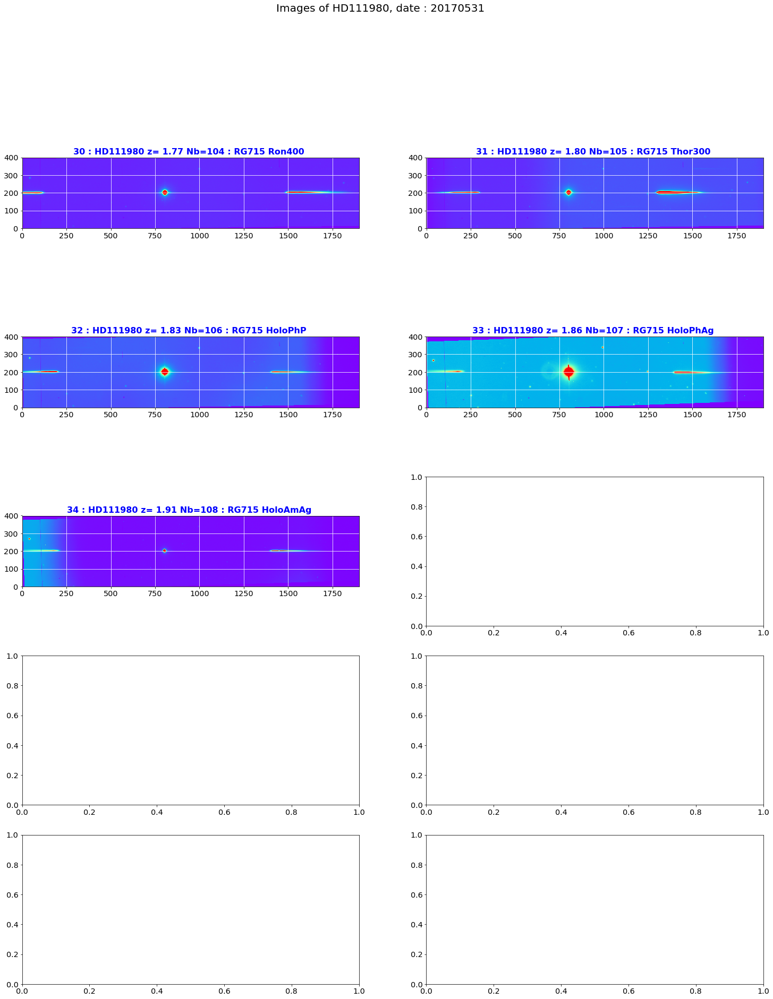

In [20]:
ShowImagesinPDF(all_images,all_titles,object_name,dir_top_images,all_filt,date)

# Find central star

- central star in the current image

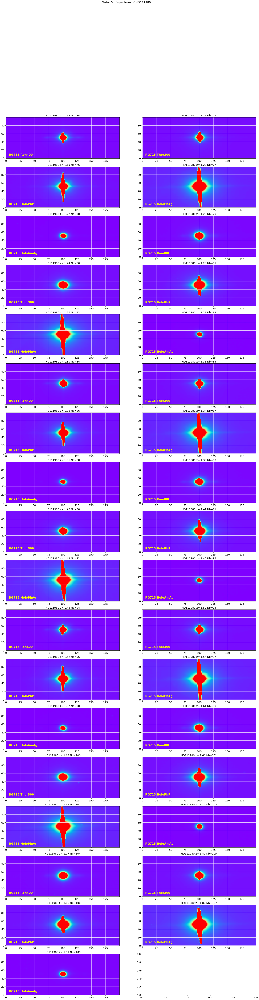

In [21]:
# Center : Order 0
#-------------------
# start at star
y_star0=[all_images[0].shape[0]/2]*len(all_images)
x_star0=x_star2
#ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
#                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
ShowCenterImages(x_star0,y_star0,[100]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

title='Order 0 of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'order0.pdf')
plt.savefig(figfilename)  

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


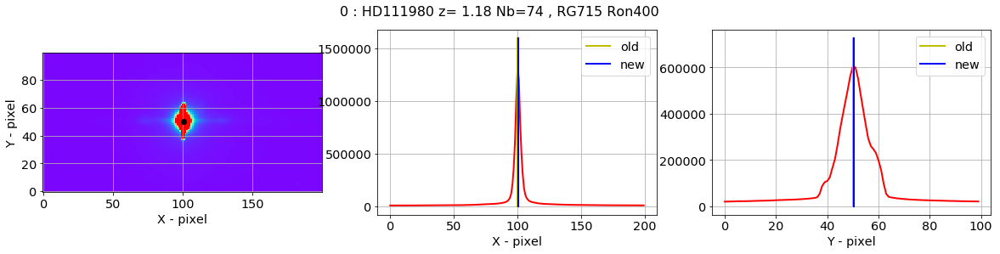

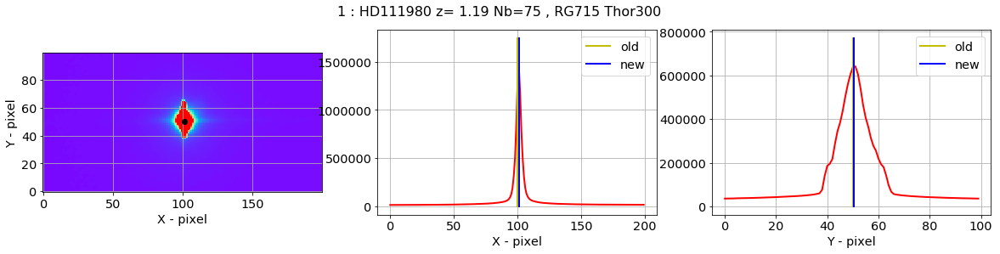

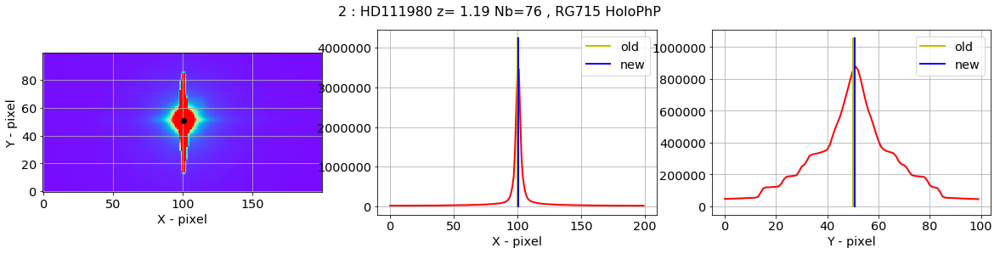

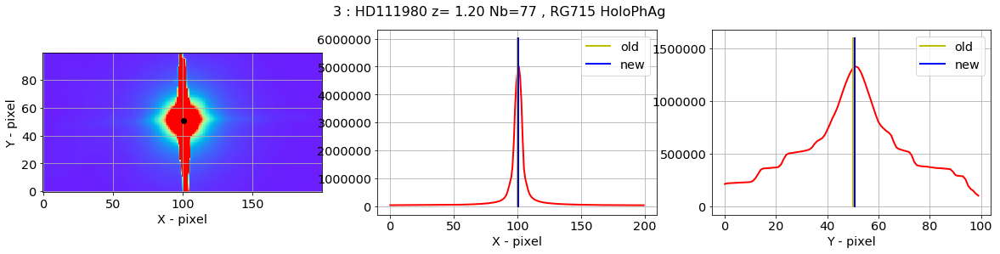

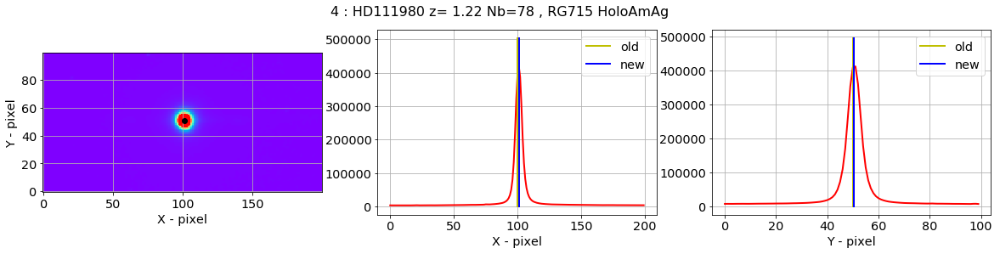

...

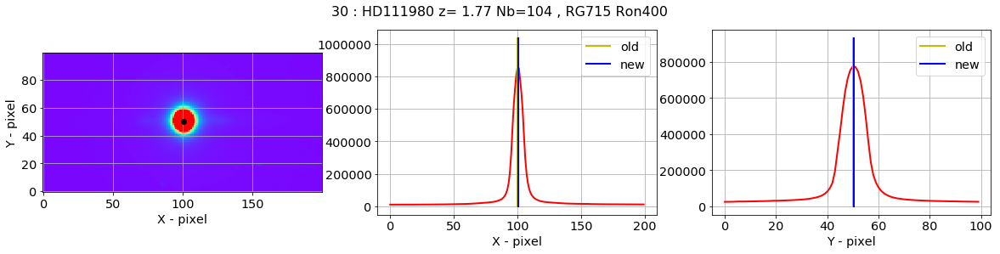

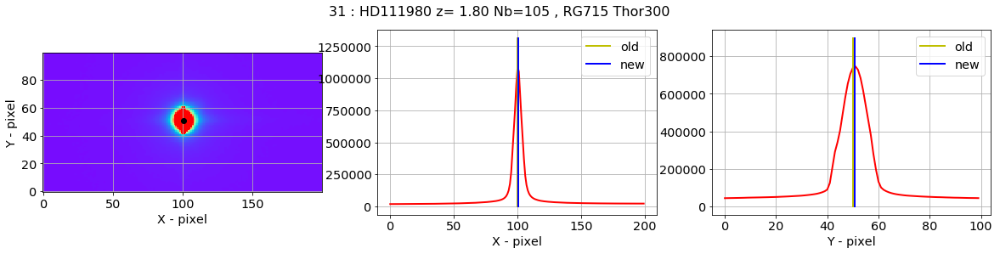

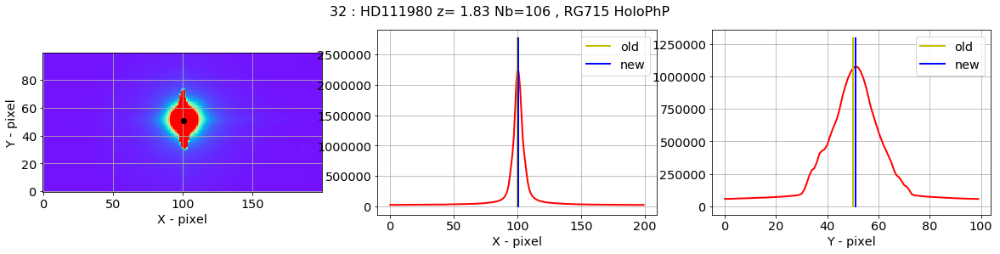

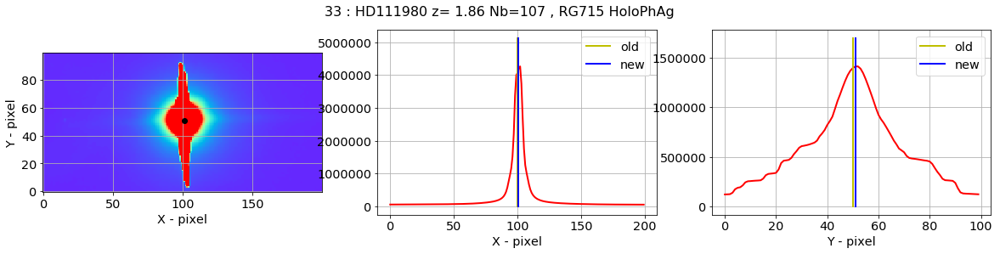

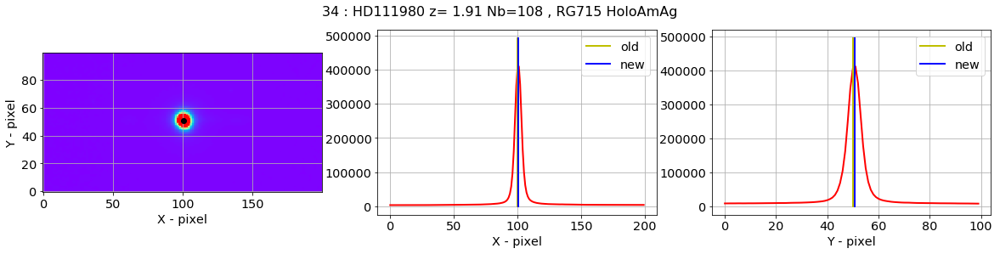

In [22]:
new_x_star,new_y_star=check_central_star(all_images,x_star2,y_star0,all_titles,all_filt)

## One order

- very long to print ! May be skipped

In [23]:
if PRINT_ONEORDER_PDF:
    ShowOneOrderinPDF(all_images,all_titles,new_x_star,new_y_star,object_name,all_expo,dir_top_images,all_filt,date,'firstorderright.pdf')

## Contours 

- are much faster to save in PDF

pdf Page written  1
pdf Page written  2
pdf Page written  3
Final pdf Page written  3


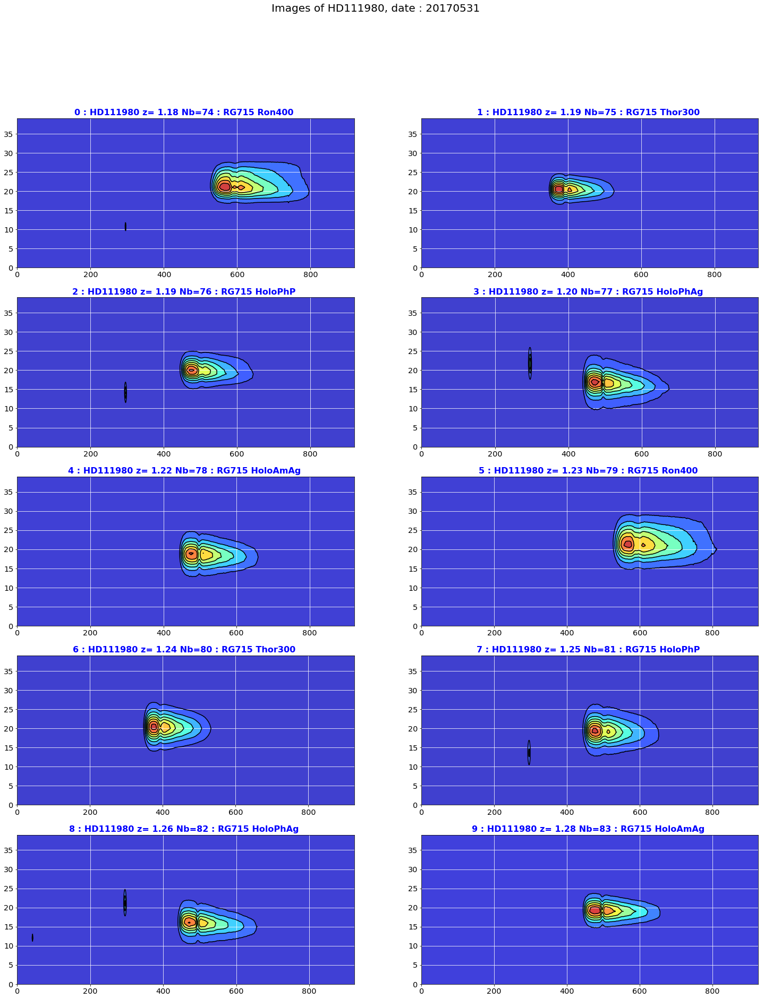

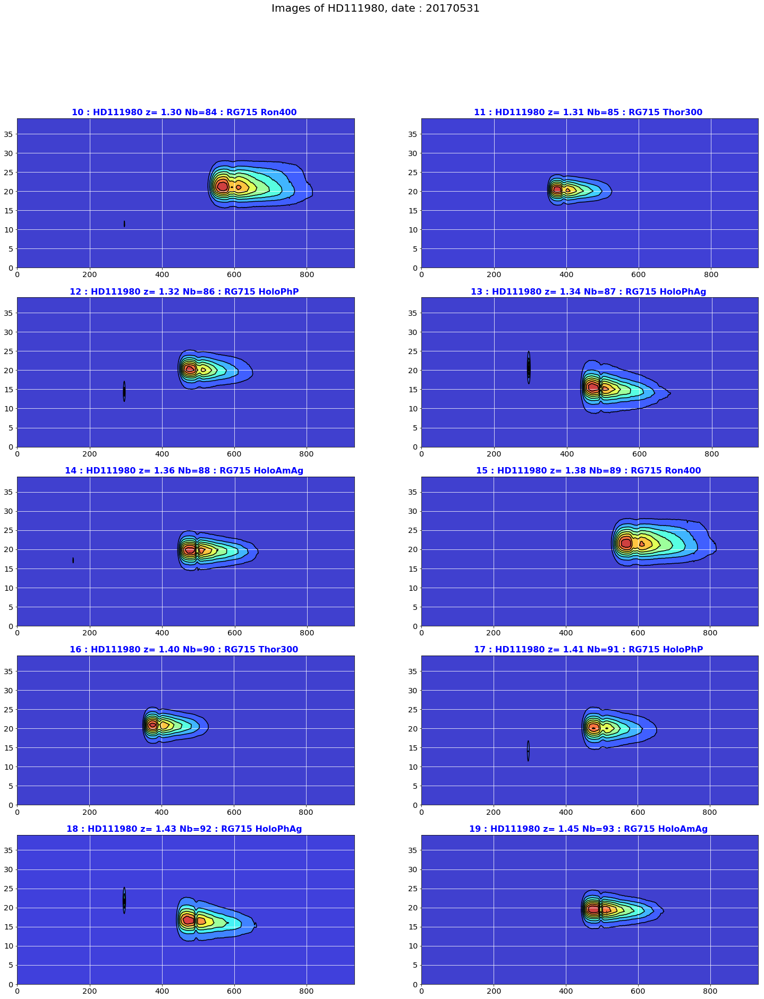

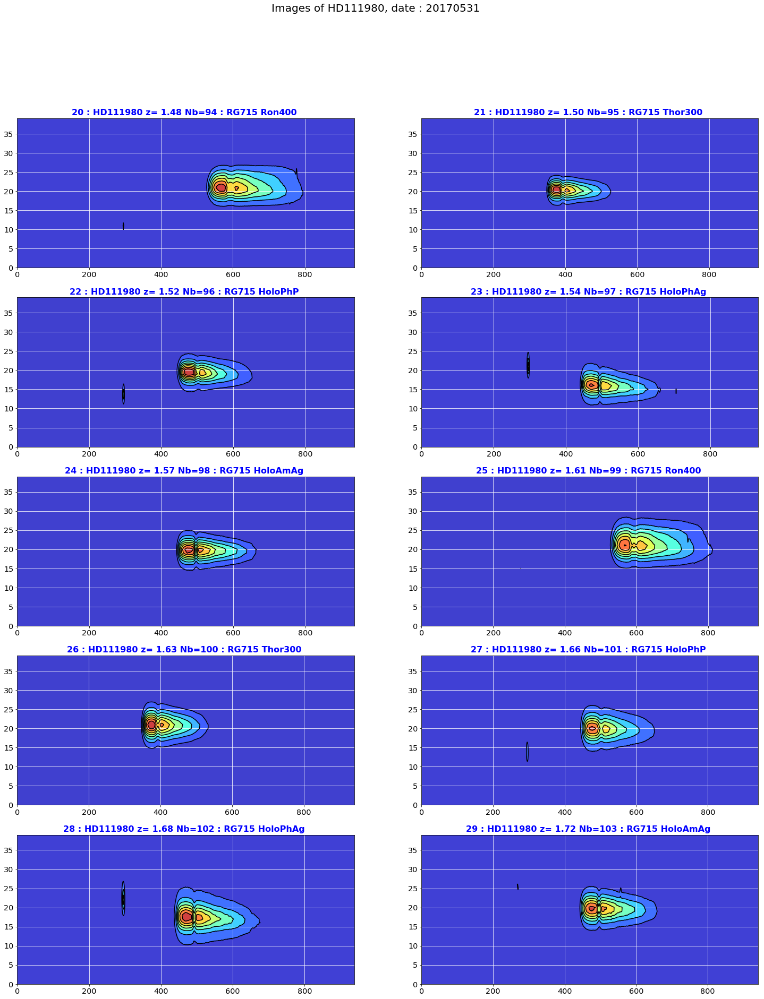

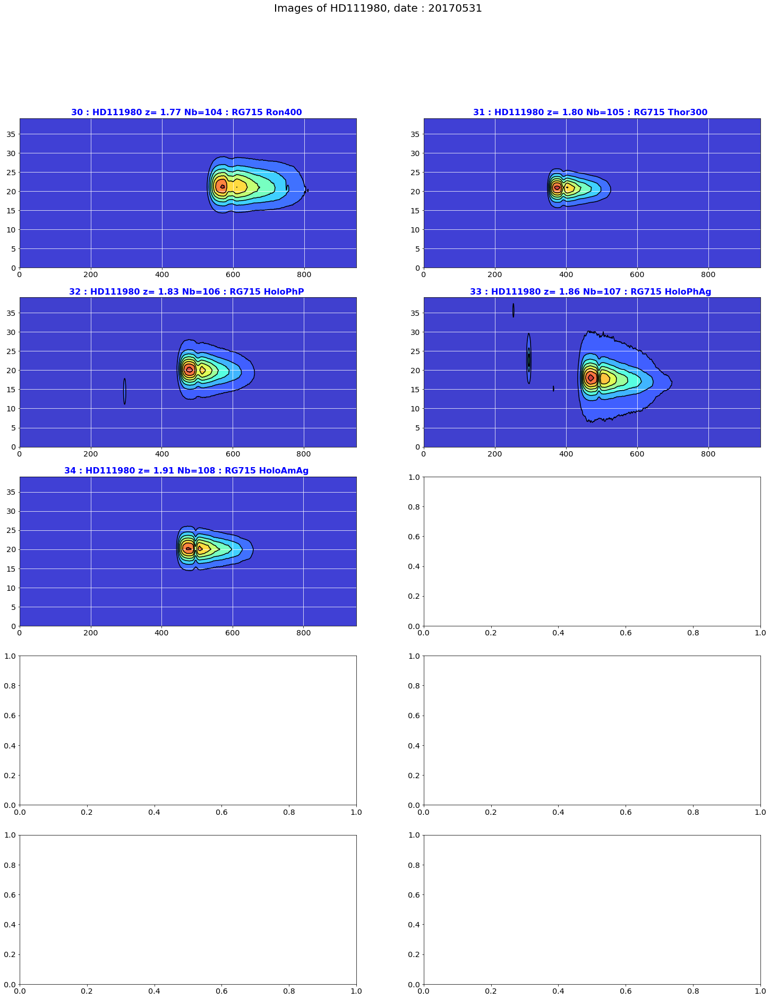

In [24]:
ShowOneOrder_contourinPDF(all_images,all_titles,new_x_star,new_y_star,object_name,all_expo,dir_top_images,all_filt,date,'firstorderright_contour.pdf')

# Show the transverse profile and extract the spectra

- select order + 1
- check the center in Y is correct
- check the selected transverse width is OK

## method 1


- method from Sylvie, based on transverse sum

- Take two lateral band at a distance 40 pixels
- The width of each band is +/- 10 pixels

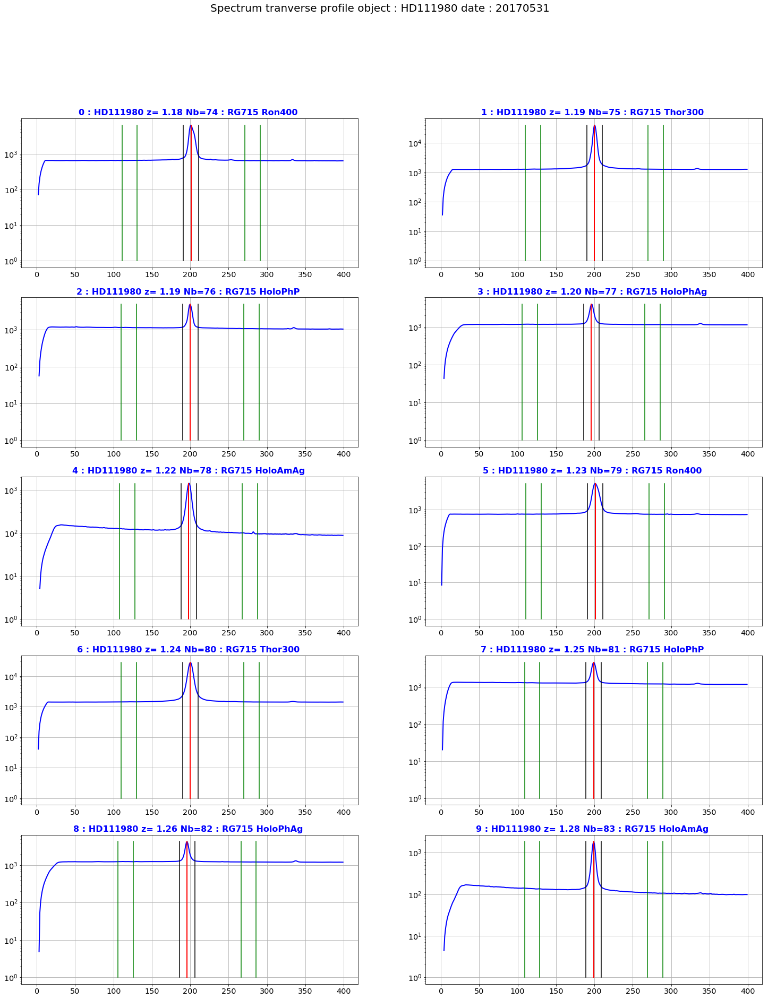

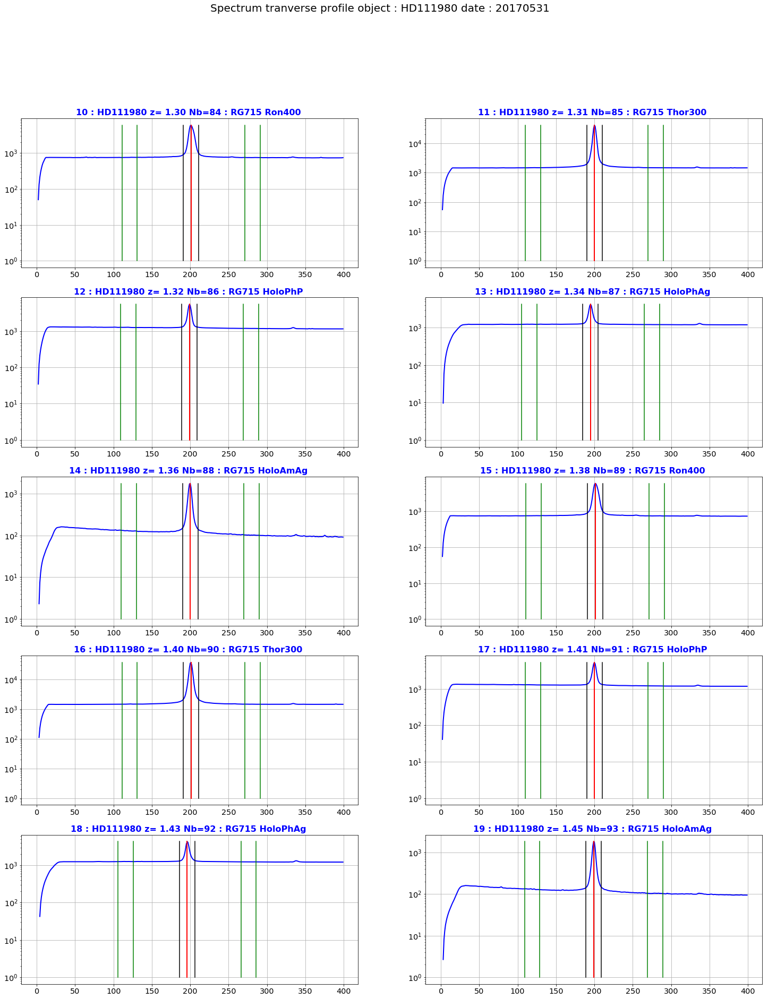

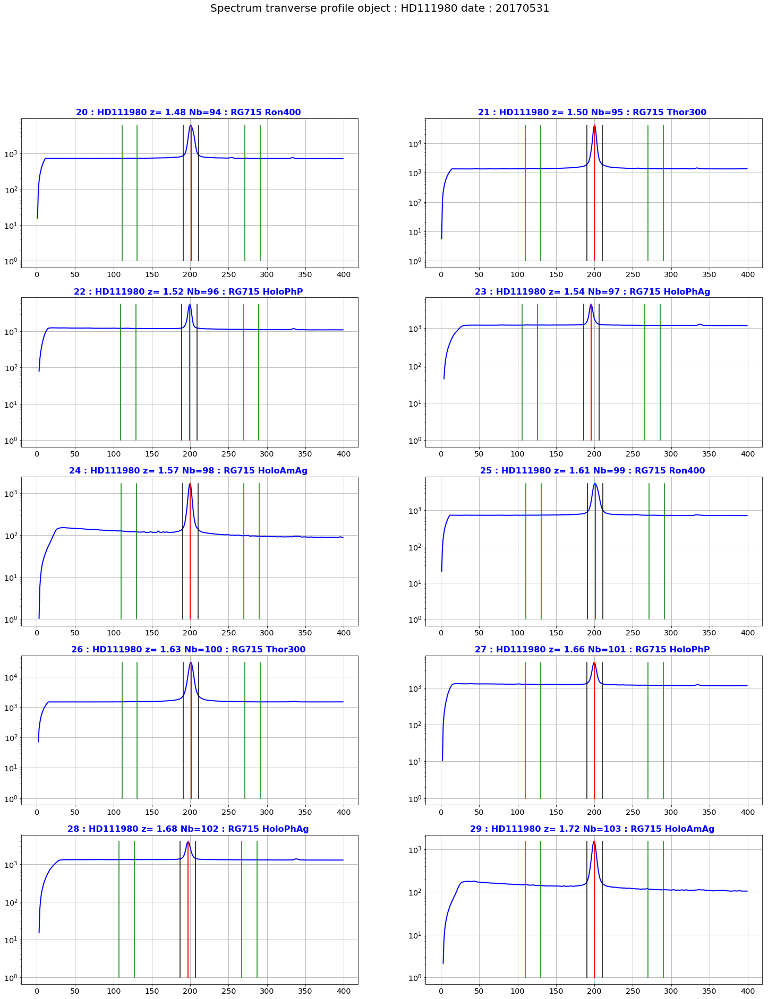

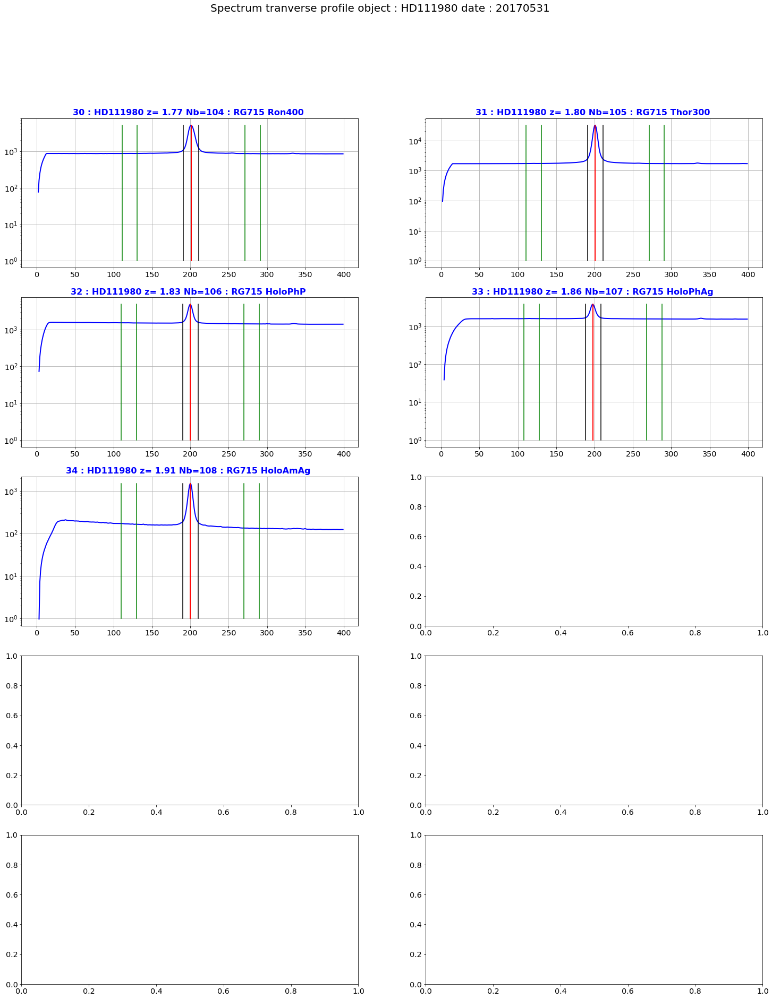

In [25]:
thespectra,thespectraUp,thespectraDown,they0=ShowTransverseProfileinPDF(all_images,new_x_star,all_titles,object_name,all_expo,dir_top_images,all_filt,date,'transverse_profile.pdf',w=10,Dist=80)

In [26]:
print they0

[201, 200, 200, 196, 198, 201, 200, 199, 196, 199, 201, 200, 199, 195, 200, 201, 201, 200, 196, 199, 201, 200, 199, 196, 200, 201, 201, 200, 197, 200, 201, 201, 200, 198, 200]


In [27]:
print thespectra[0].shape

(1900,)


## method 2
- method from Jeremy based on transverse mean (median)
- somethibg wrong here

In [28]:
#they02=ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=2,
#                      DeltaX=1000,w=10,ws=[20,30],right_edge=1800,ylim=(1e2,2e7))

In [29]:
#thespectra2,thespectraUp2,thespectraDown2=ExtractSpectra(they0,all_images,all_titles,object_name,all_expo,
#                                                      w=10,ws=[40,10],right_edge=1800)

## Check both backgrounds (up and down)

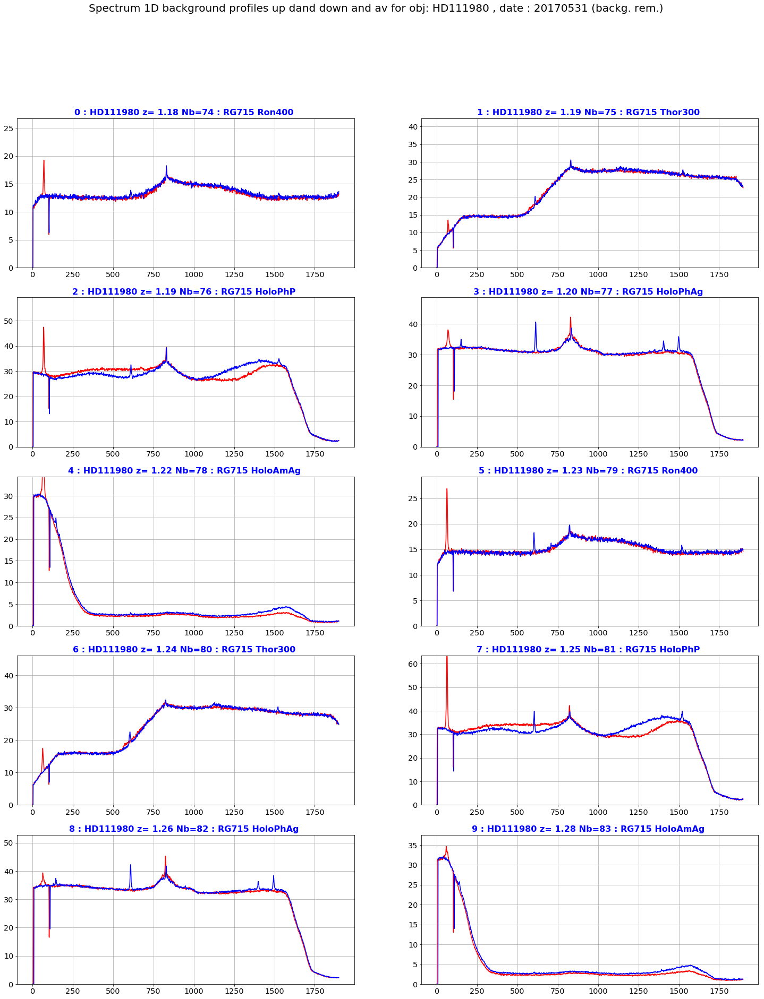

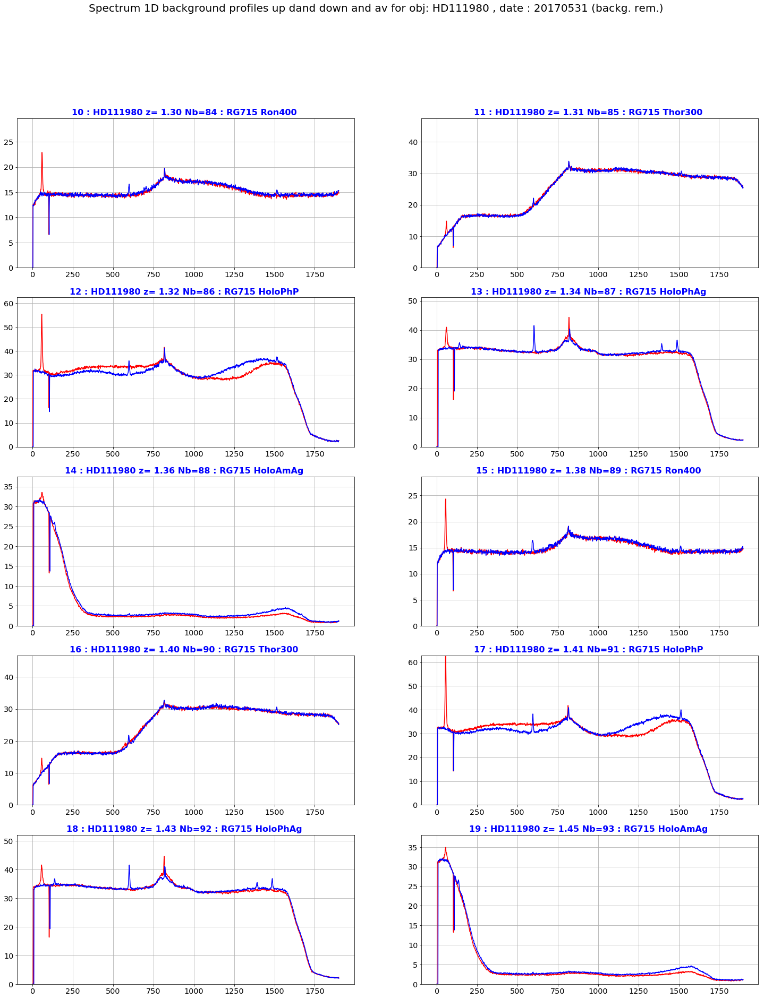

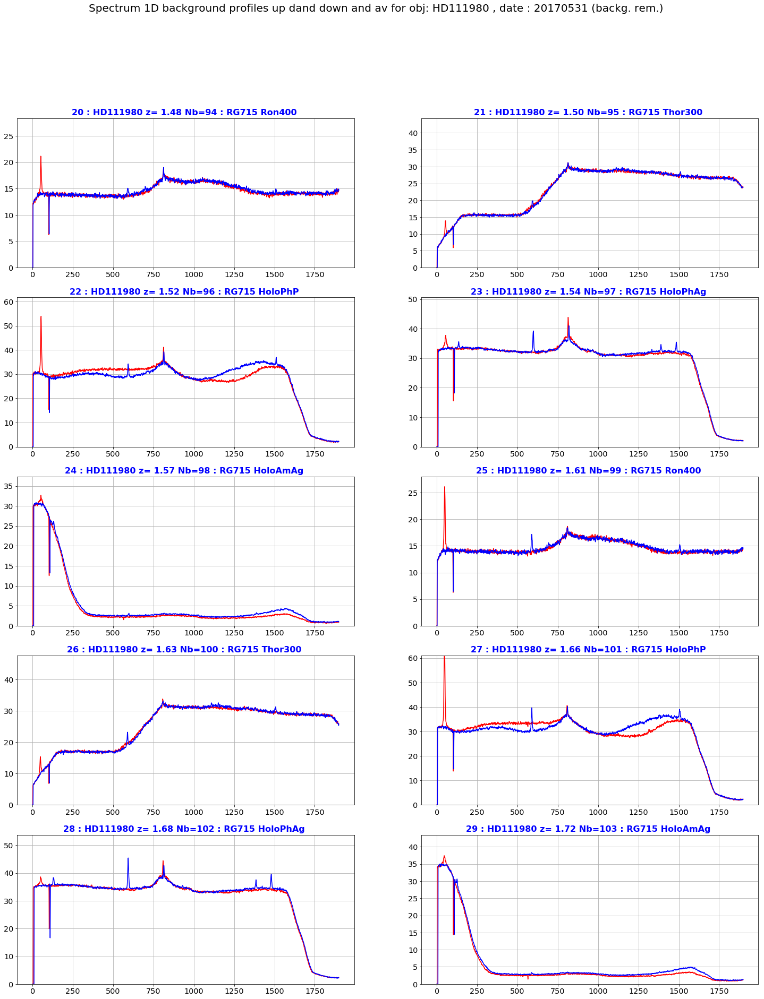

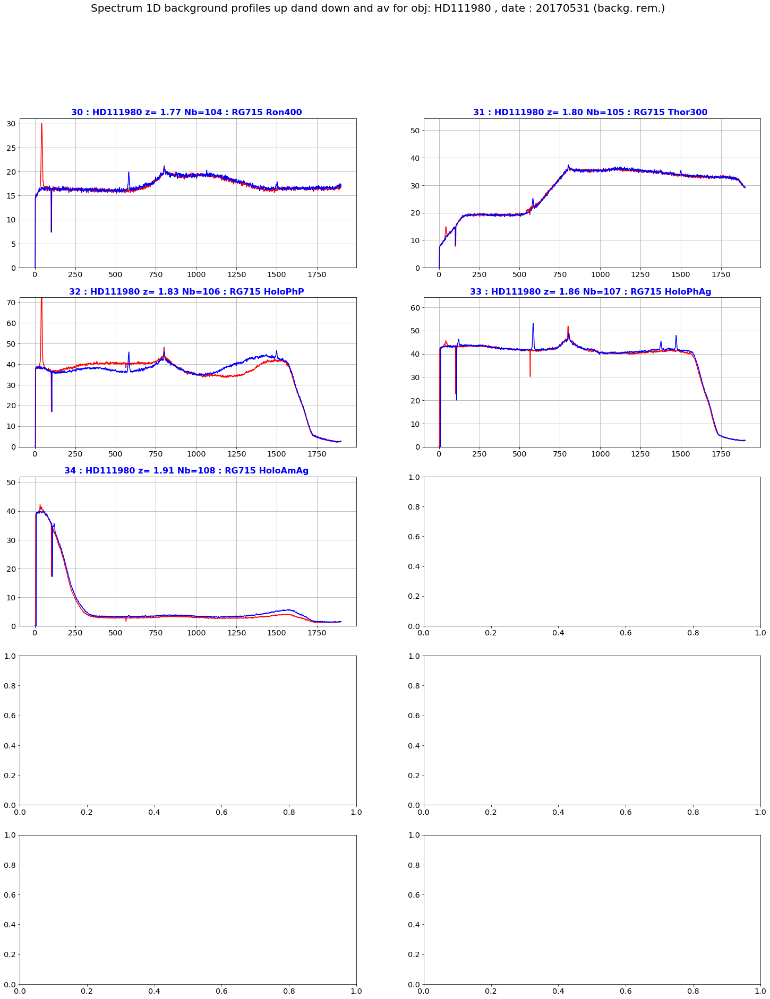

In [30]:
ShowTheBackgroundProfileUpDowninPDF(thespectraUp,thespectraDown,all_titles,object_name,dir_top_images,all_filt,date,'backgroundupdown_profile.pdf')

# Left and Right order

## Right order

In [31]:
#ShowRightOrder(all_images,new_x_star,they0,all_titles,object_name,all_expo,dir_top_images)

## Left order

In [32]:
#ShowLeftOrder(all_images,new_x_star,they0,all_titles,object_name,all_expo,dir_top_images)

## Clean pixels

In [33]:
#Clean_Up2, Clean_Do2,Clean_Av2=CleanBadPixels(thespectraUp2,thespectraDown2) 

In [34]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

# Show raw spectrum and its background

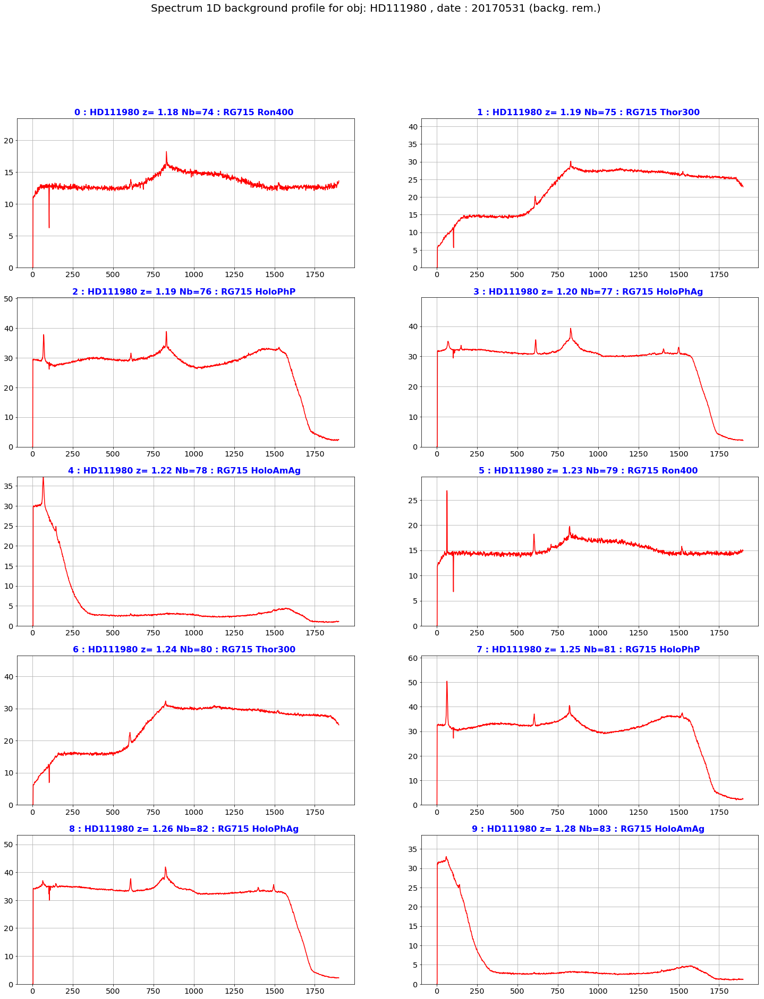

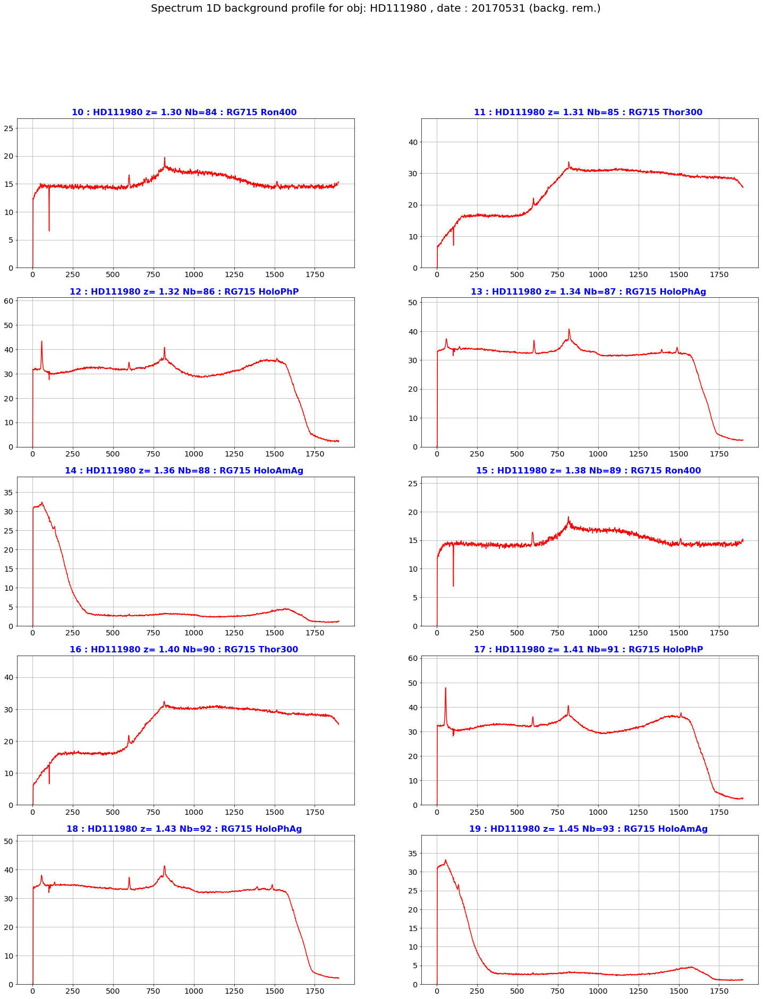

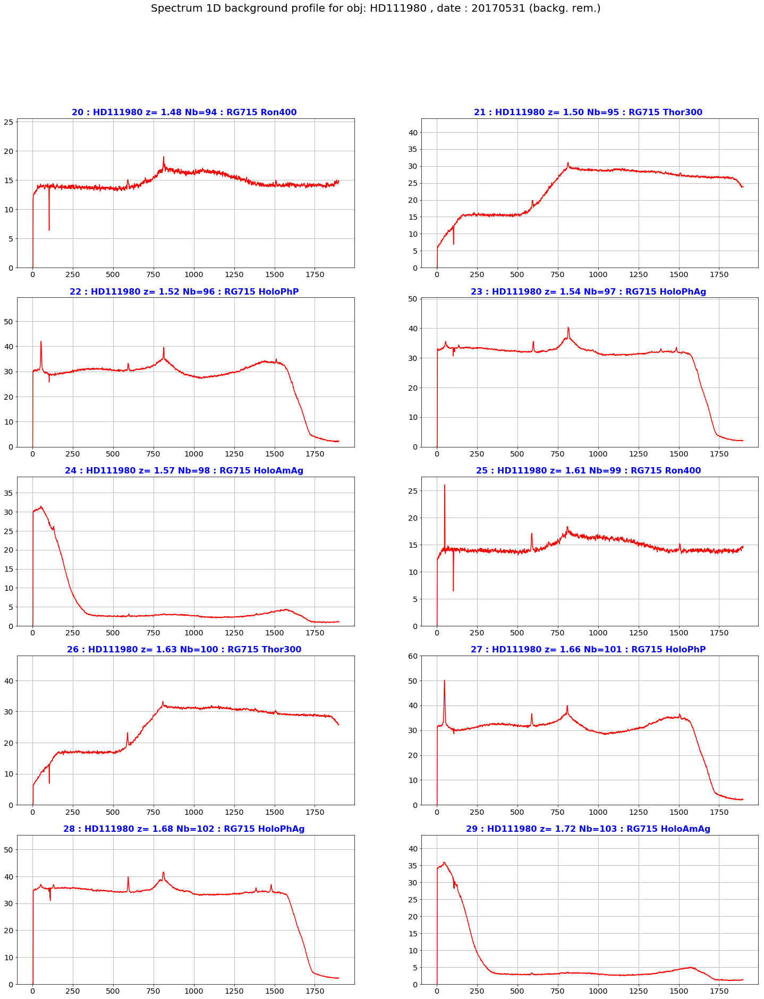

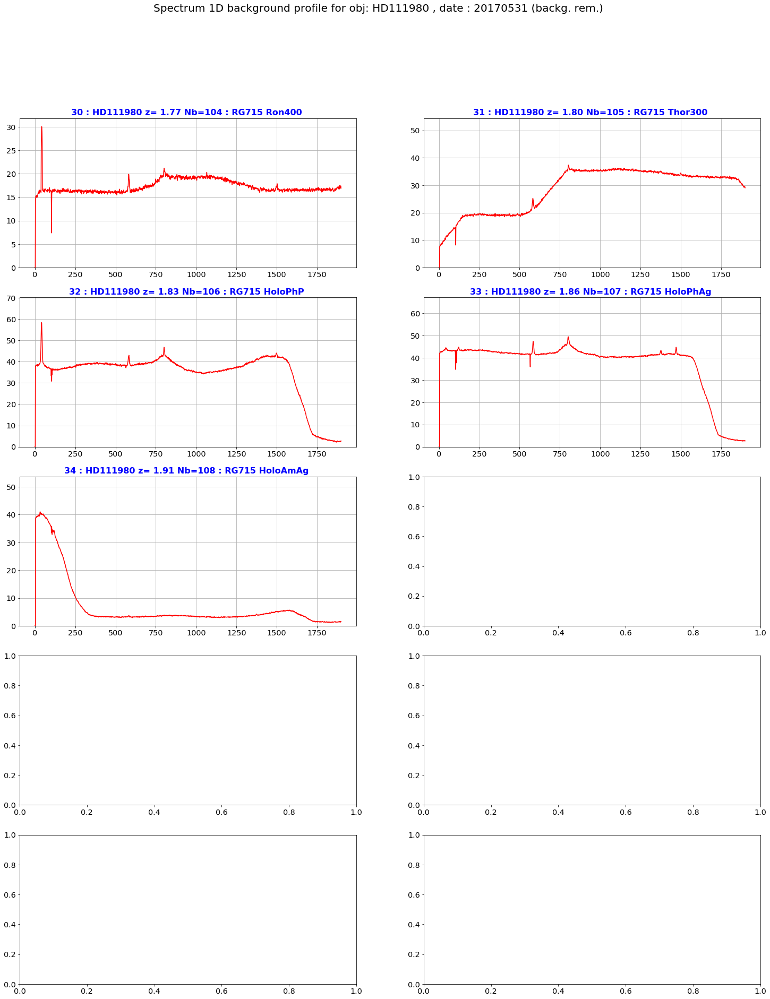

In [35]:
ShowTheBackgroundProfileinPDF(Clean_Av,all_titles,object_name,dir_top_images,all_filt,date,'averbackground_profile.pdf')

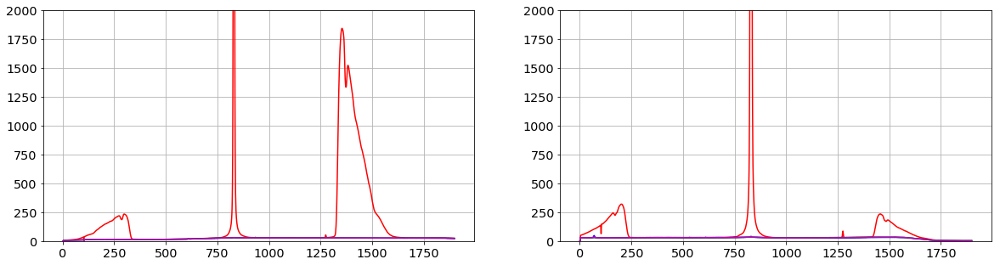

In [36]:
sel=1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))
ax1.plot(thespectra[sel],'r-') 
ax1.plot(Clean_Up[sel],'b-') 
ax1.plot(Clean_Do[sel],'g-')
ax1.plot(Clean_Av[sel],'m-')
ax1.set_ylim(0,2000)
ax1.grid(True)

ax2.plot(thespectra[sel+1],'r-') 
ax2.plot(Clean_Up[sel+1],'b-') 
ax2.plot(Clean_Do[sel+1],'g-')
ax2.plot(Clean_Av[sel+1],'m-')
ax2.set_ylim(0,2000)
ax2.grid(True)


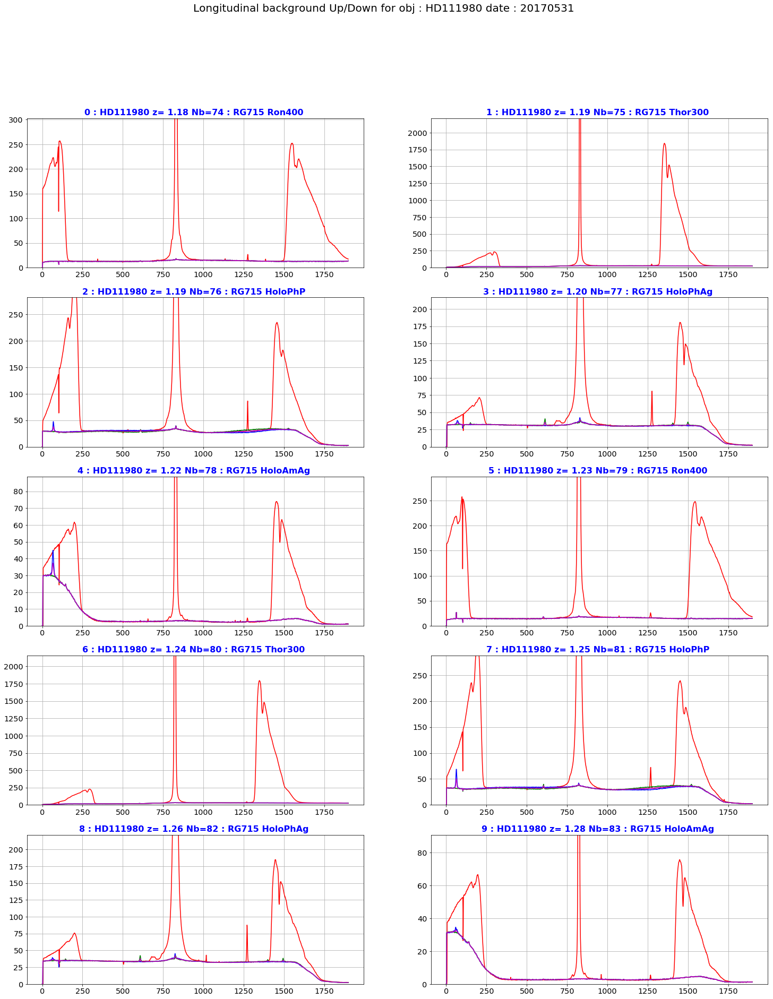

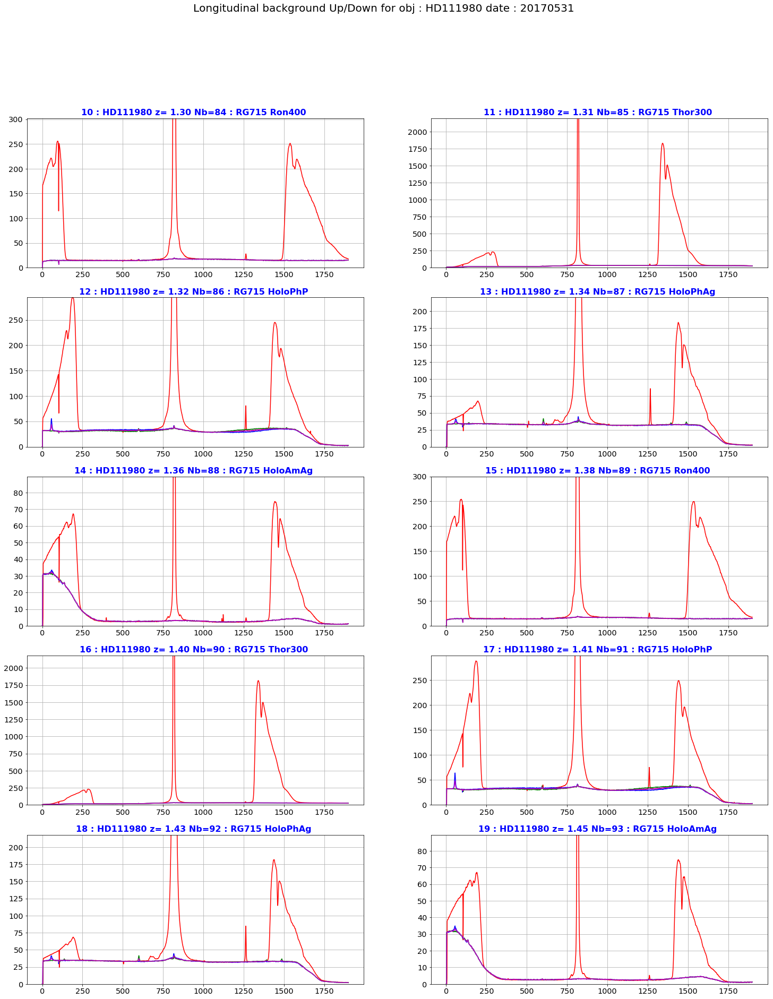

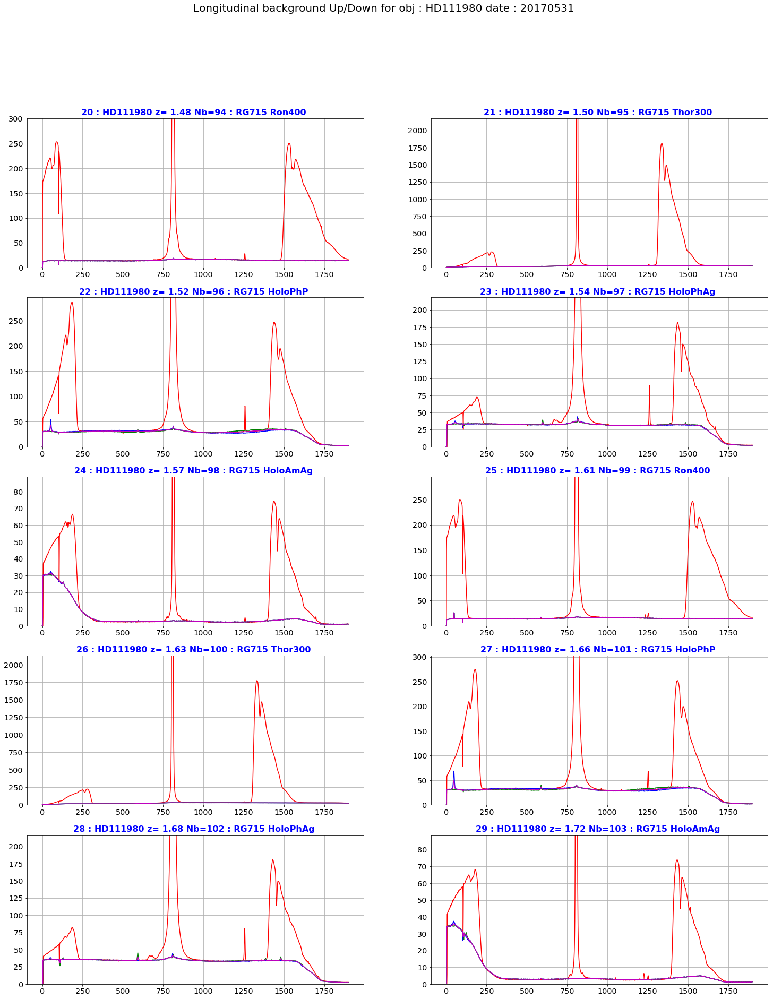

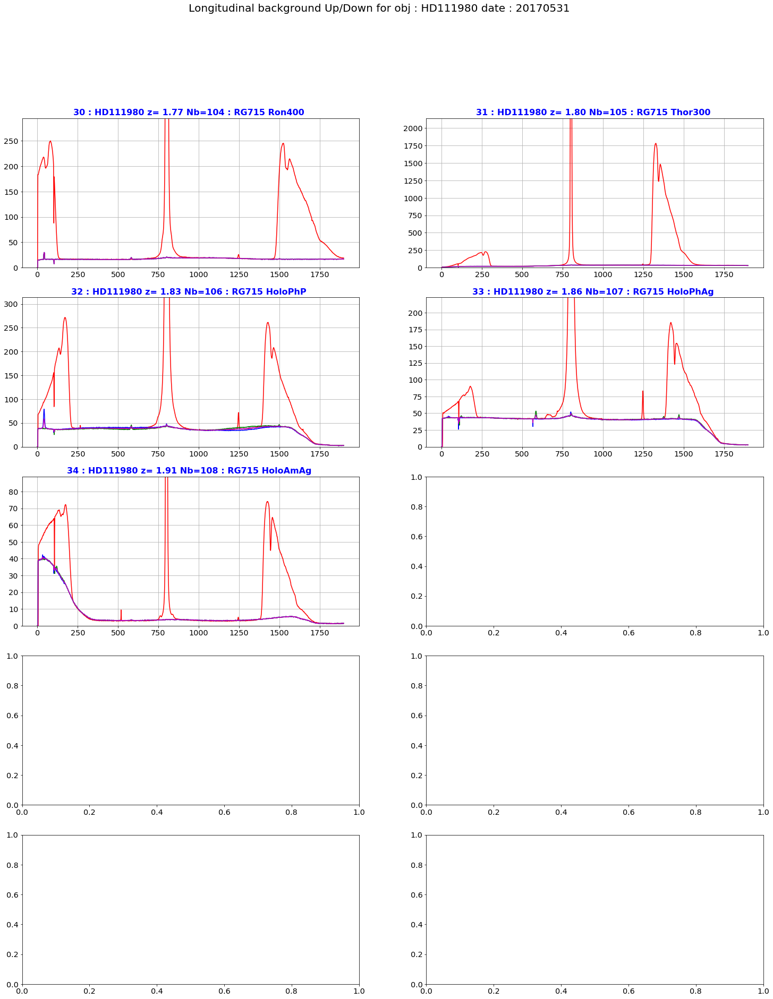

In [37]:
ShowLongitBackgroundinPDF(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,object_name,dir_top_images,all_filt,date,'background_longprofile.pdf')

# Correct spectrum from its sky background

In [38]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

## Whole spectra

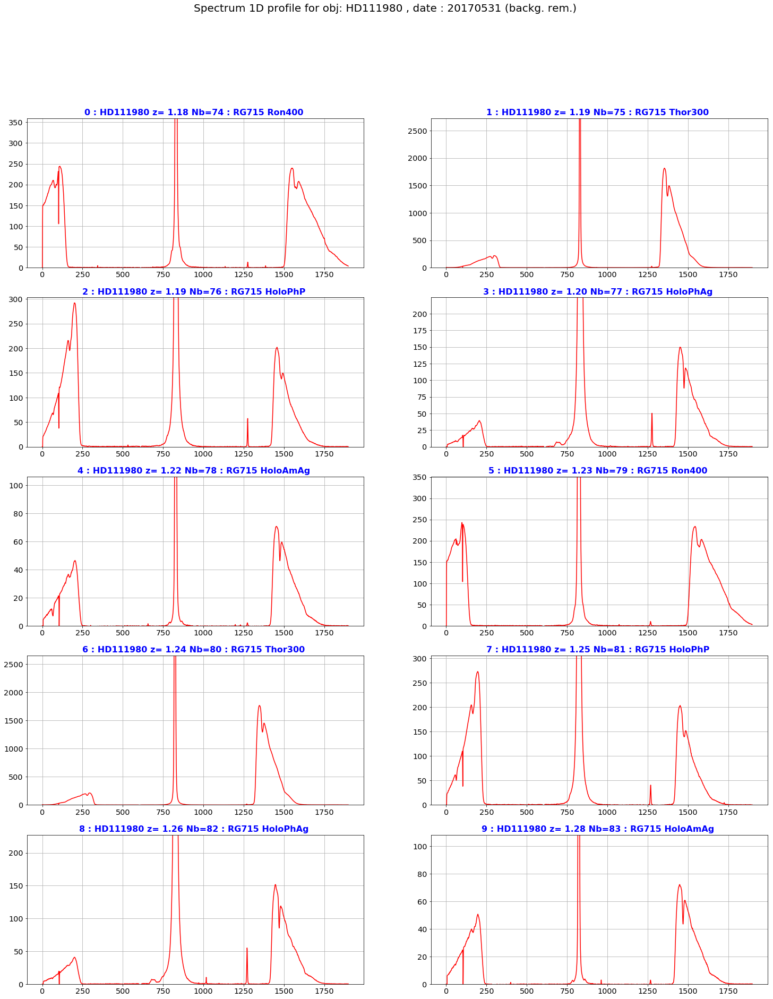

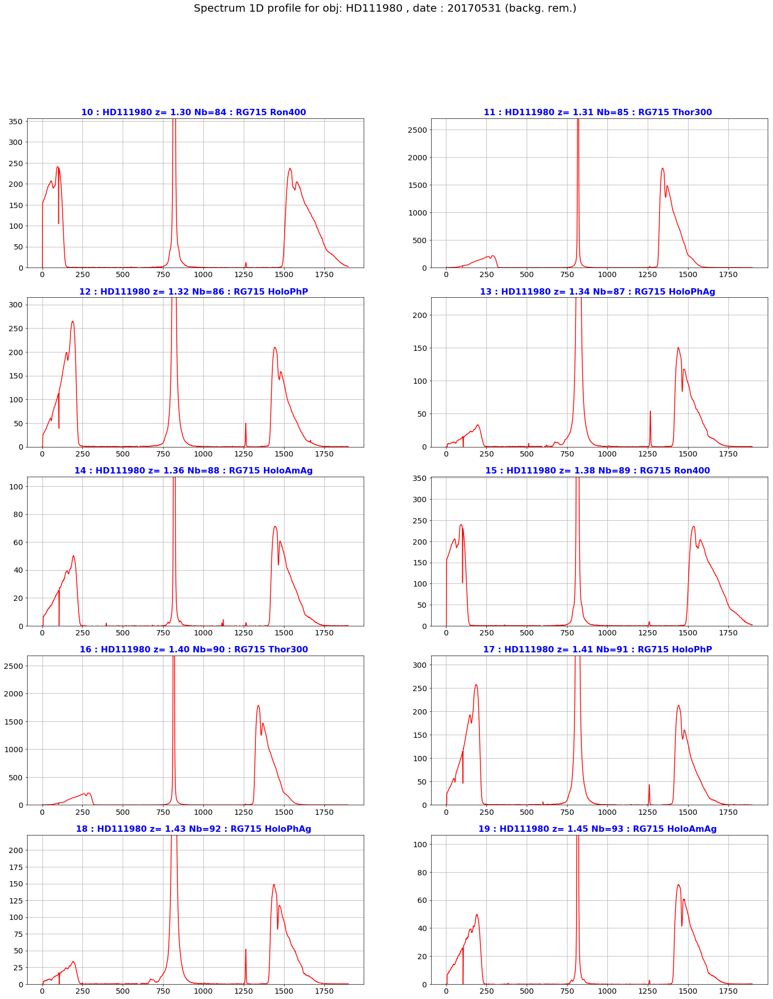

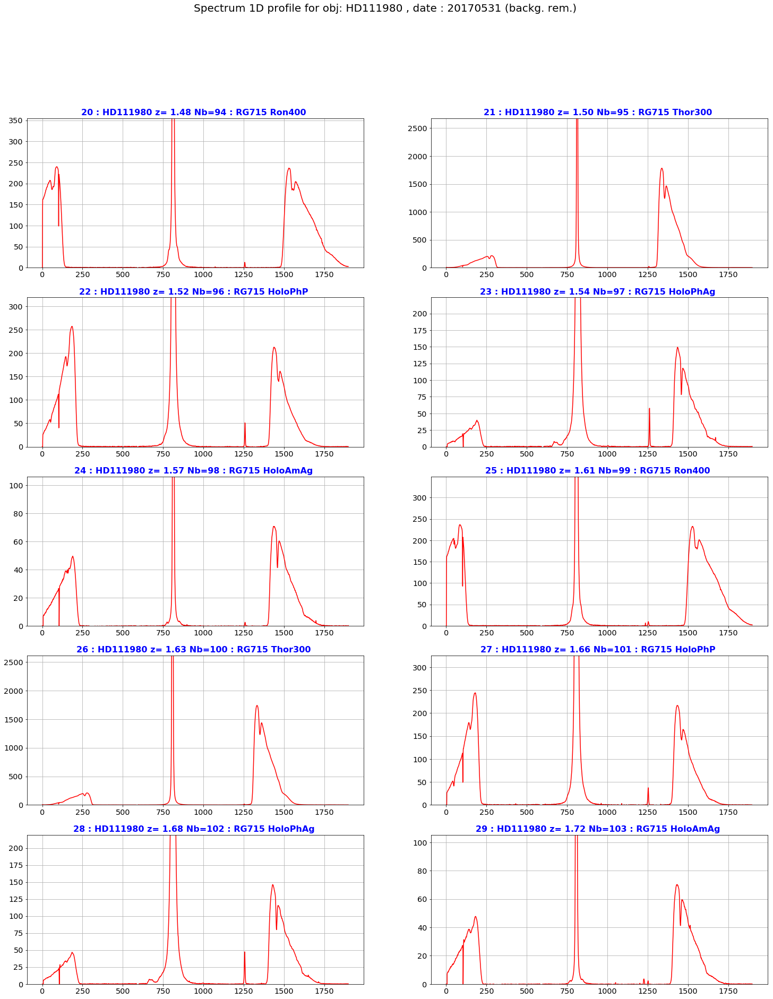

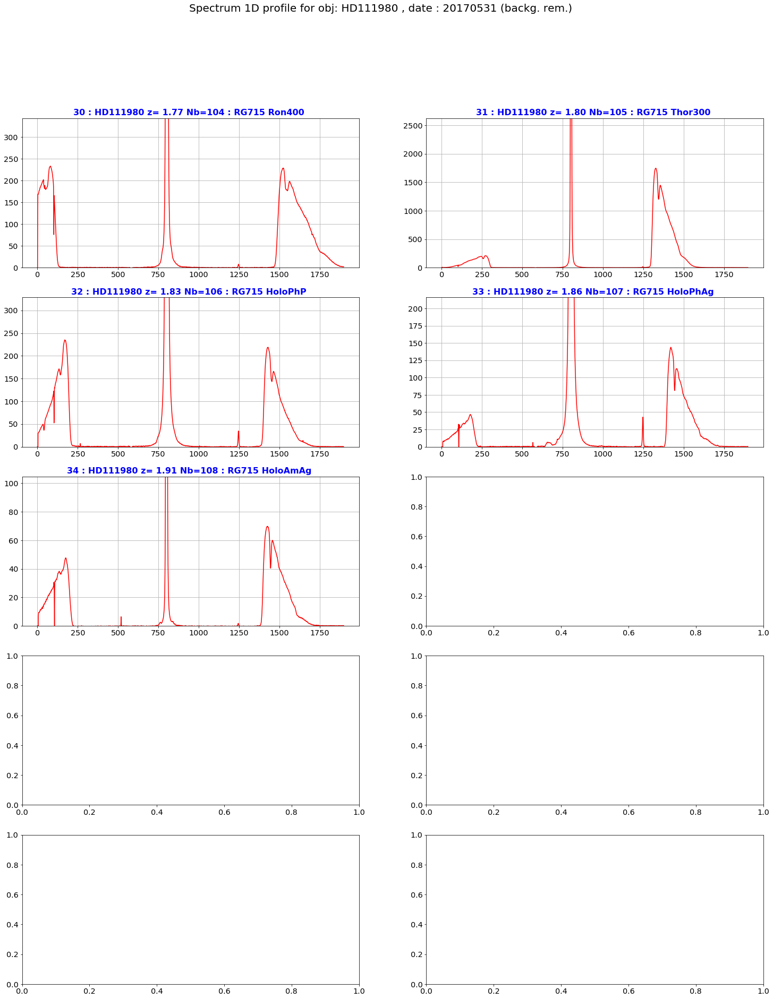

In [39]:
ShowCorrectedSpectrumProfileinPDF(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,date,'correctedspectrum_profile.pdf')

## Right spectra

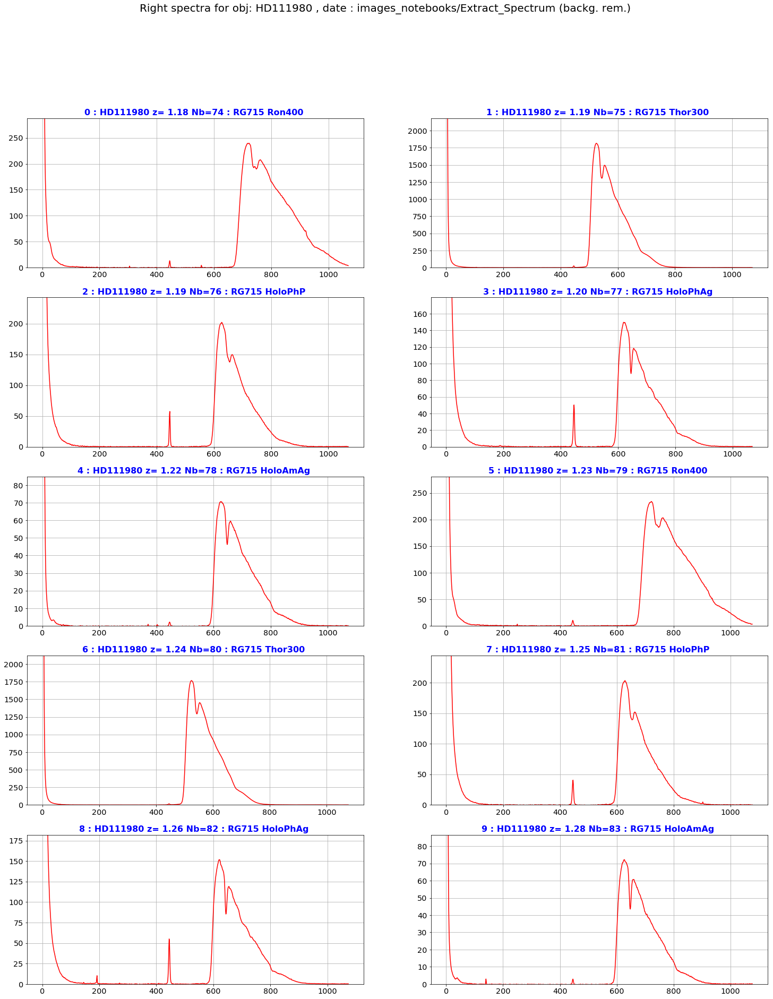

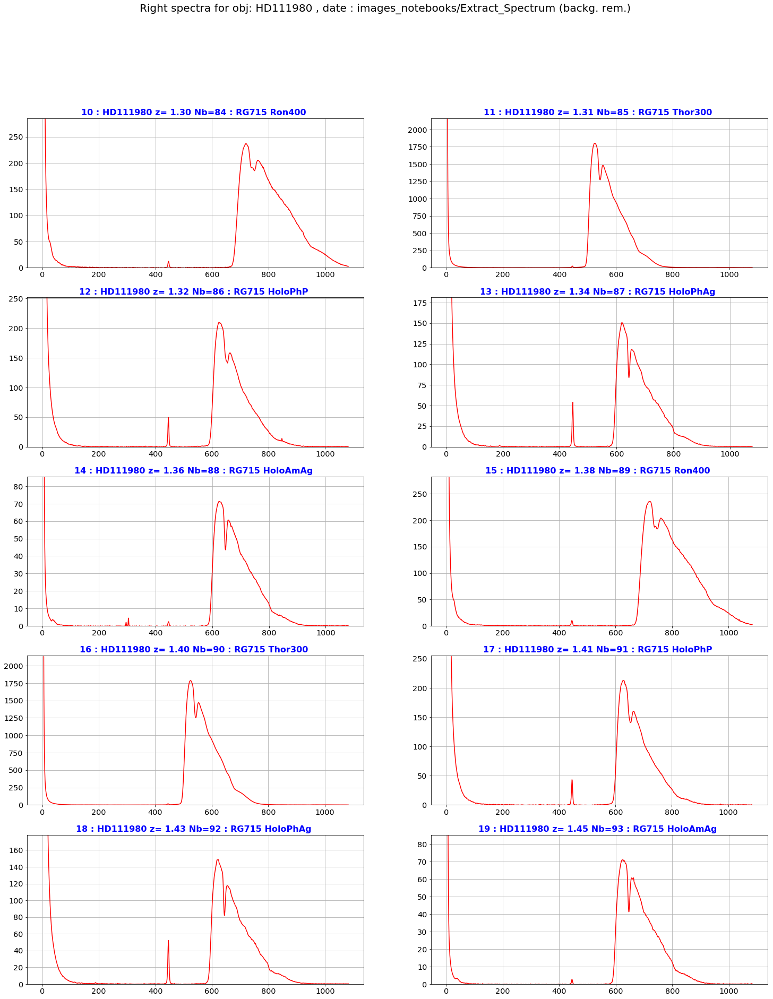

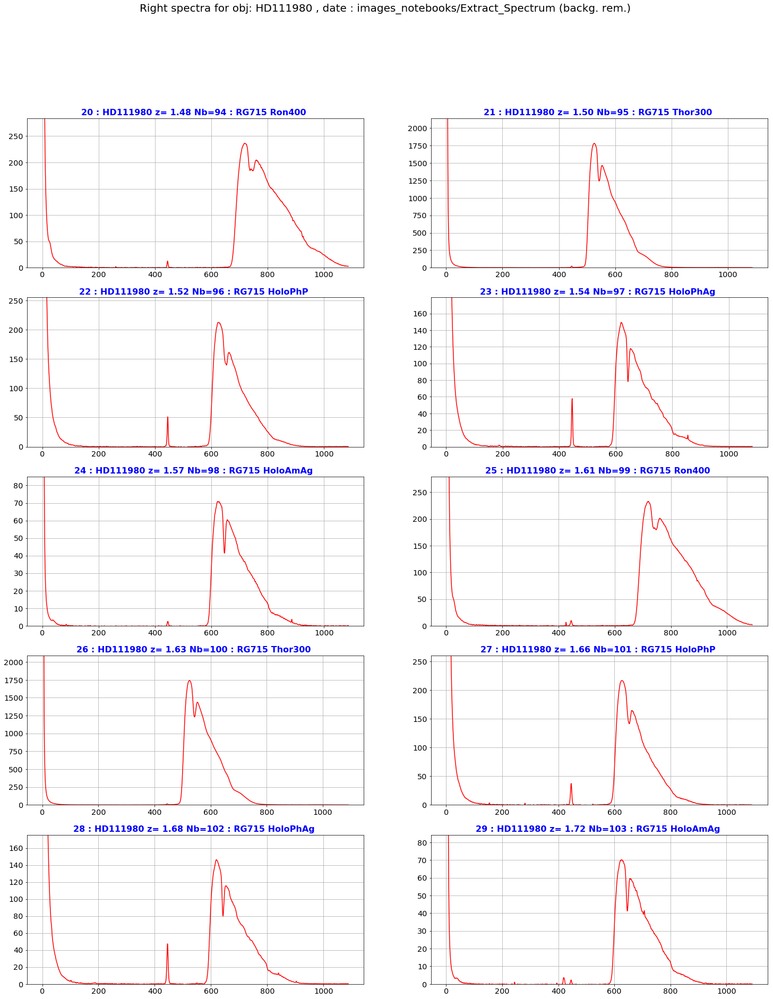

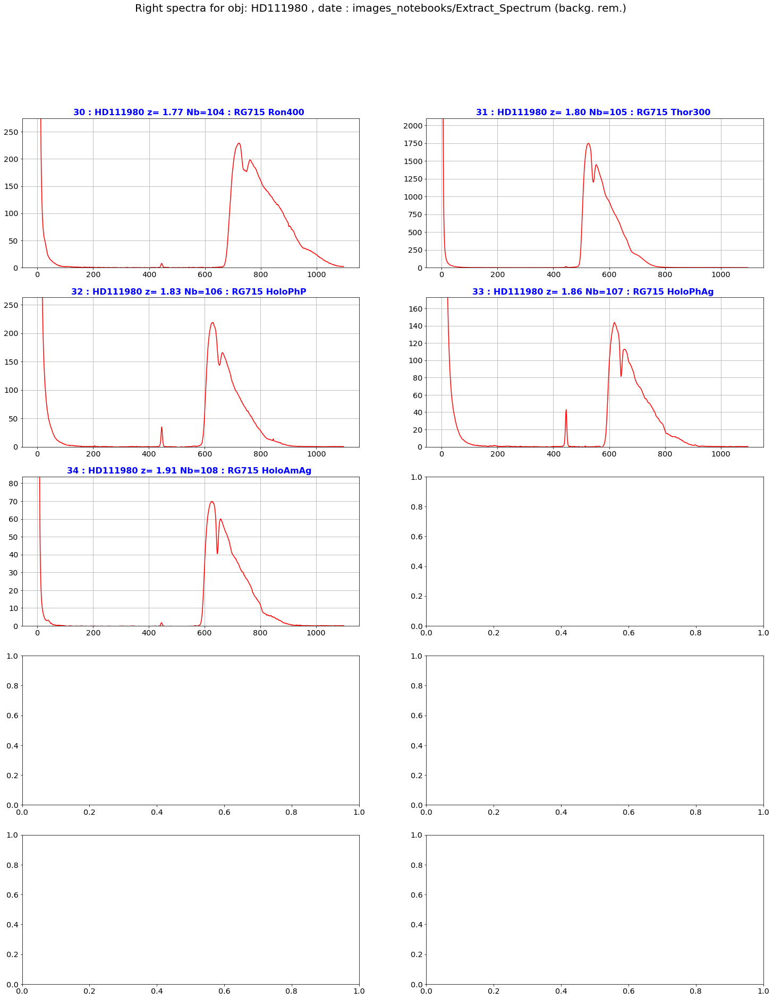

In [40]:
ShowSpectrumRightProfileinPDF(thecorrspectra,new_x_star,all_titles,object_name,dir_top_images,all_filt,dir_top_images,date,'correctedspectrum_rightprofile.pdf')

## Left spectra

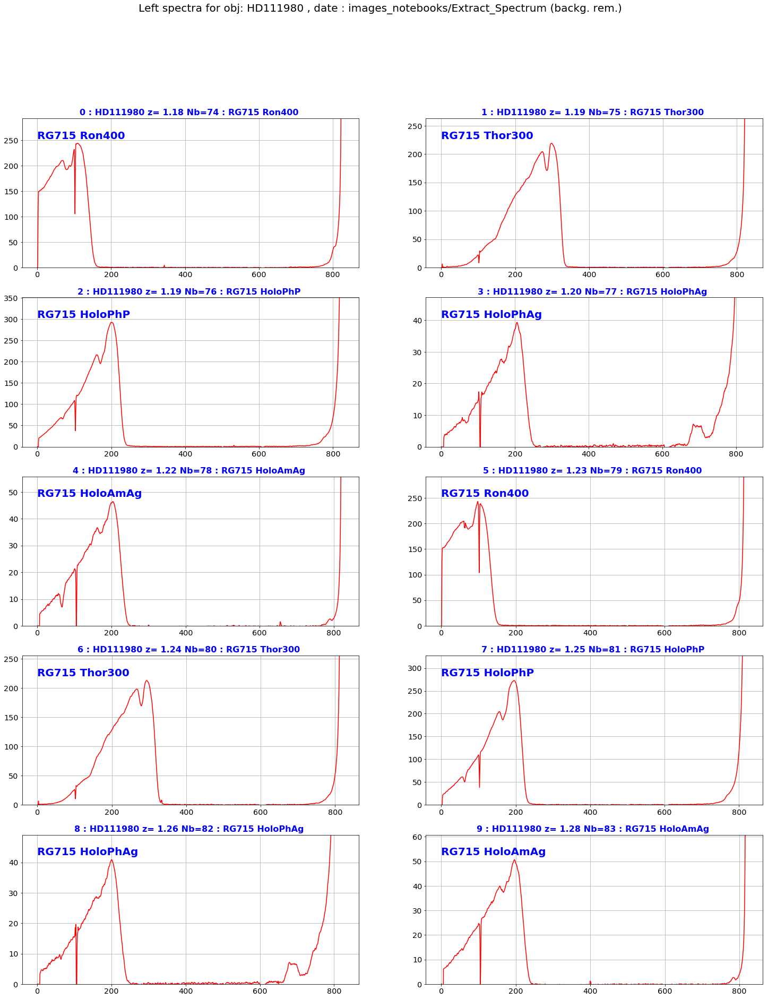

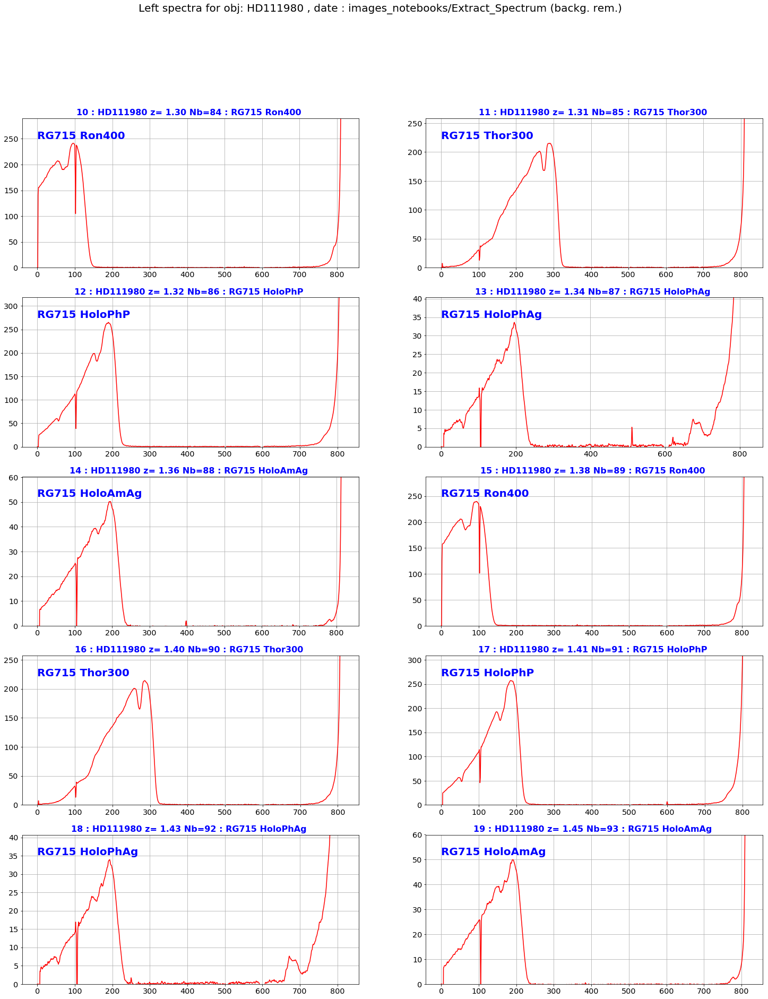

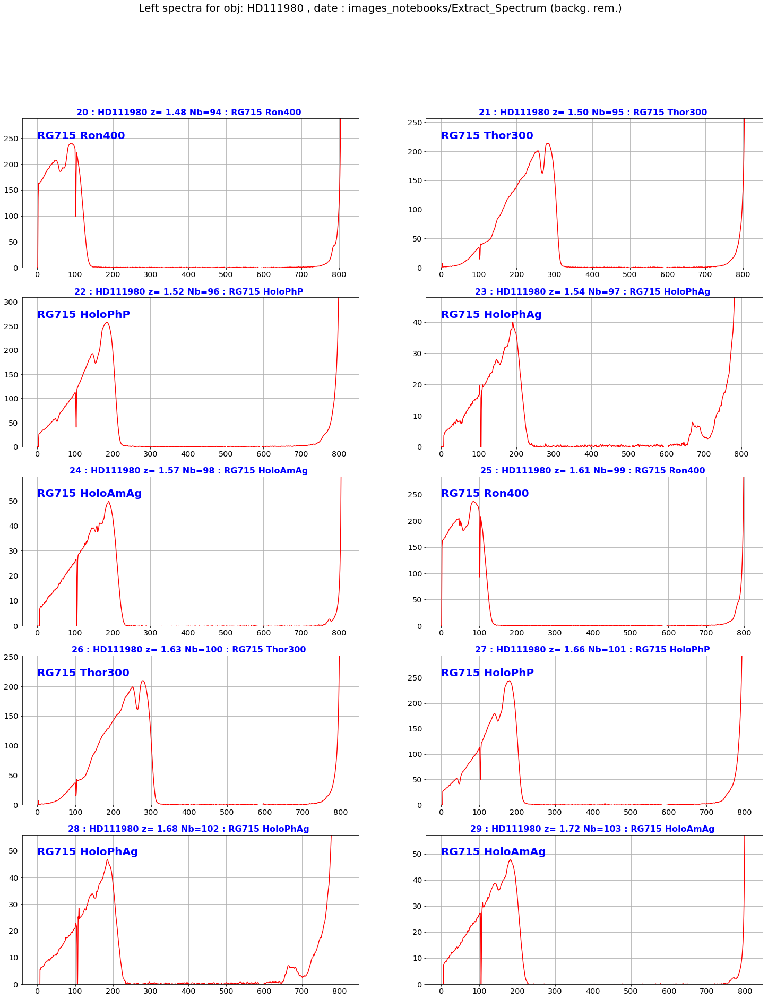

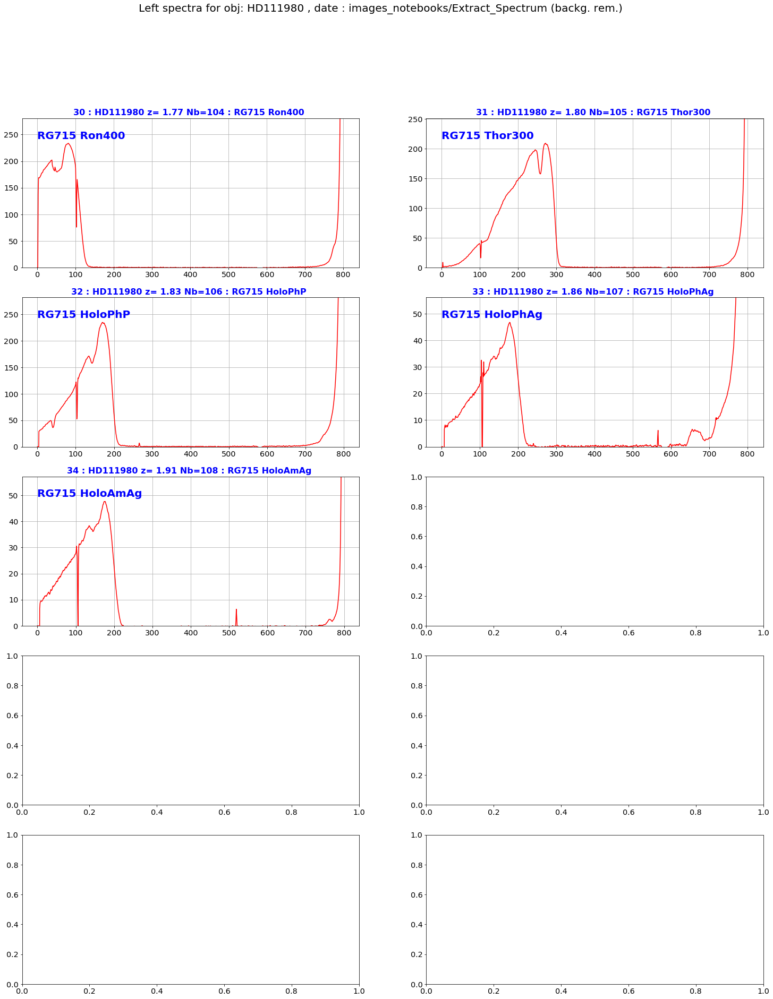

In [41]:
ShowSpectrumLeftProfileinPDF(thecorrspectra,new_x_star,all_titles,object_name,dir_top_images,all_filt,dir_top_images,date,'correctedspectrum_leftprofile.pdf')

# Refine central position


- at least need  the width to guess the error

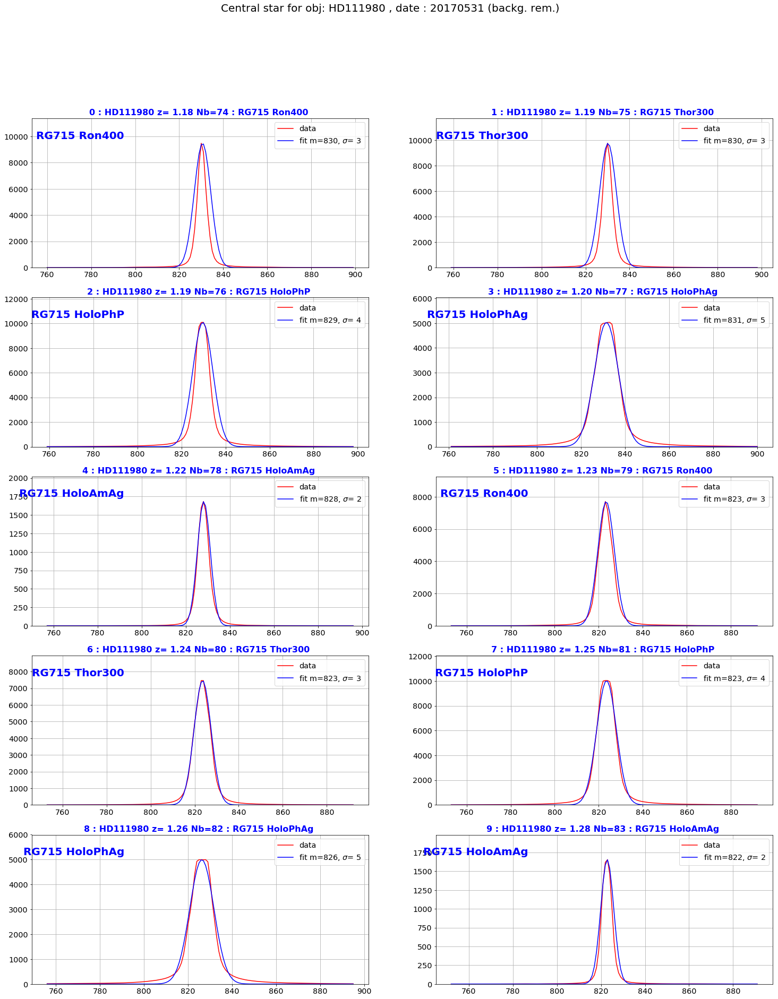

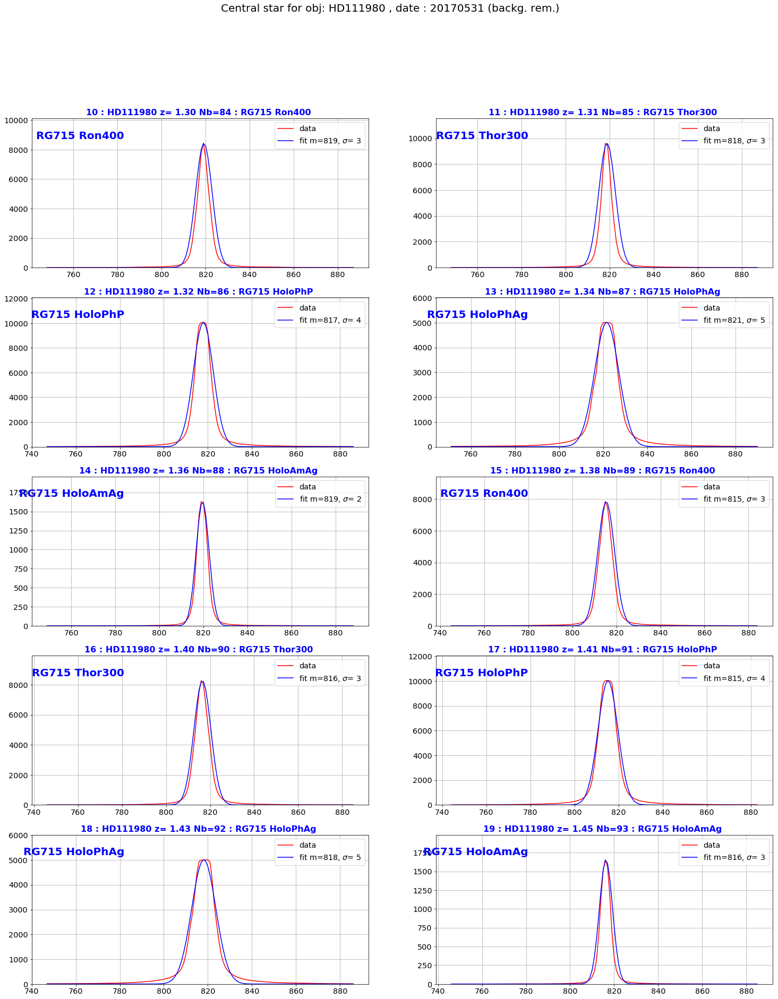

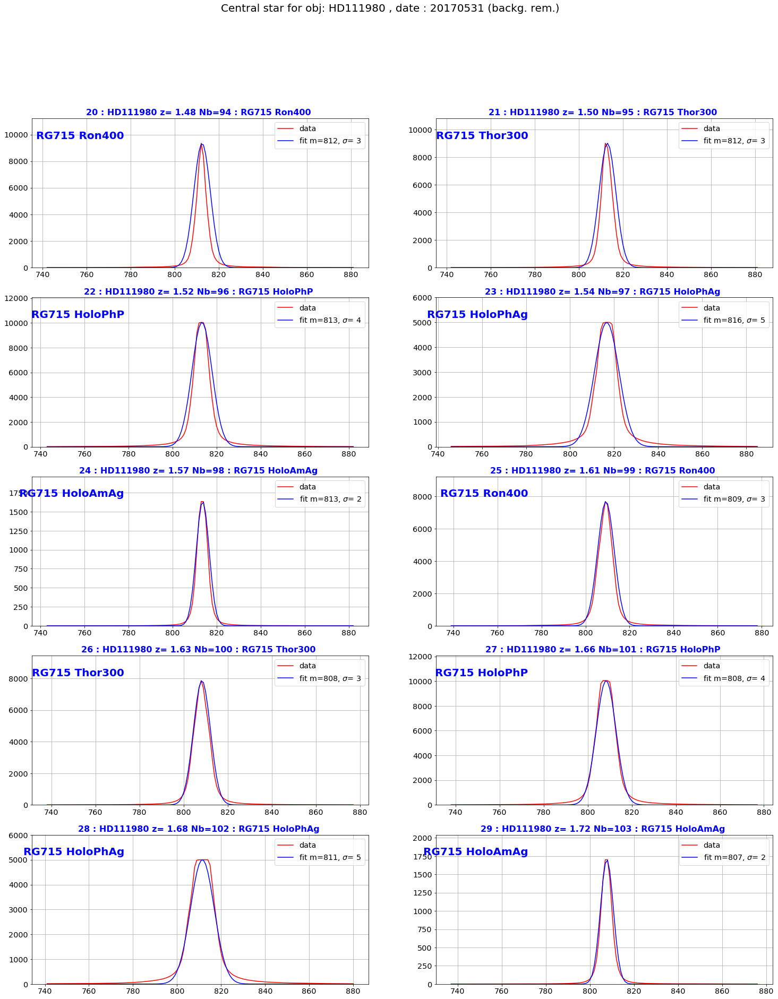

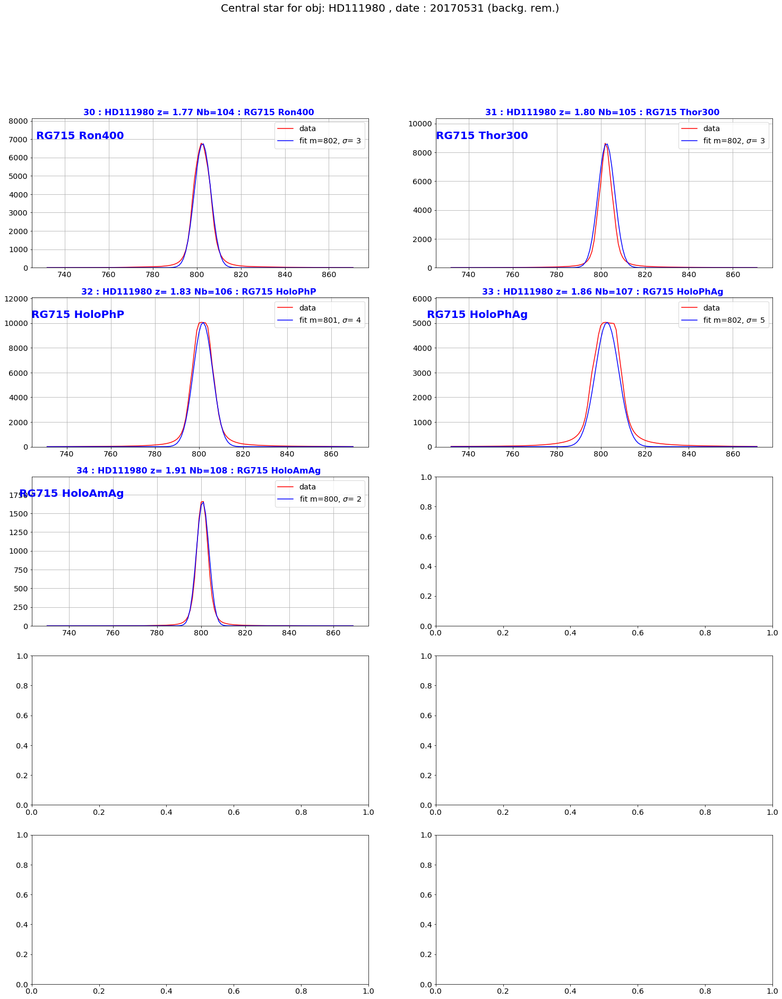

In [42]:
star_indexes_fitmean,star_indexes_fitsig=Find_CentralStar_positioninPDF(thecorrspectra,new_x_star,all_titles,object_name,dir_top_images,all_filt,date,'correctedspectrum_starprofile.pdf')

# Split spectrum

## Split Spectrum with background subtracted

### One can choose a splitting x0 either nex_x_star or star_indexes_fitmean

In [43]:
#spectra_left_final,spectra_right_final=SplitSpectrumProfileSimpleinPDF(thecorrspectra,new_x_star,all_titles,object_name,dir_top_images,all_filt,date,'split_spectra_nobg.pdf')

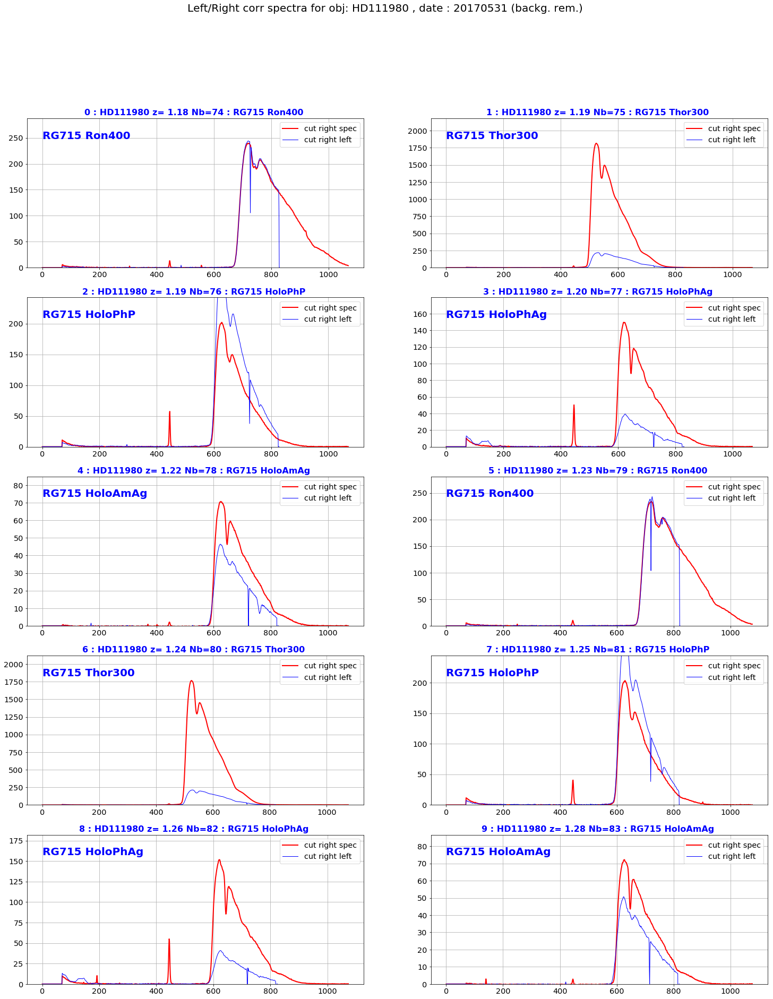

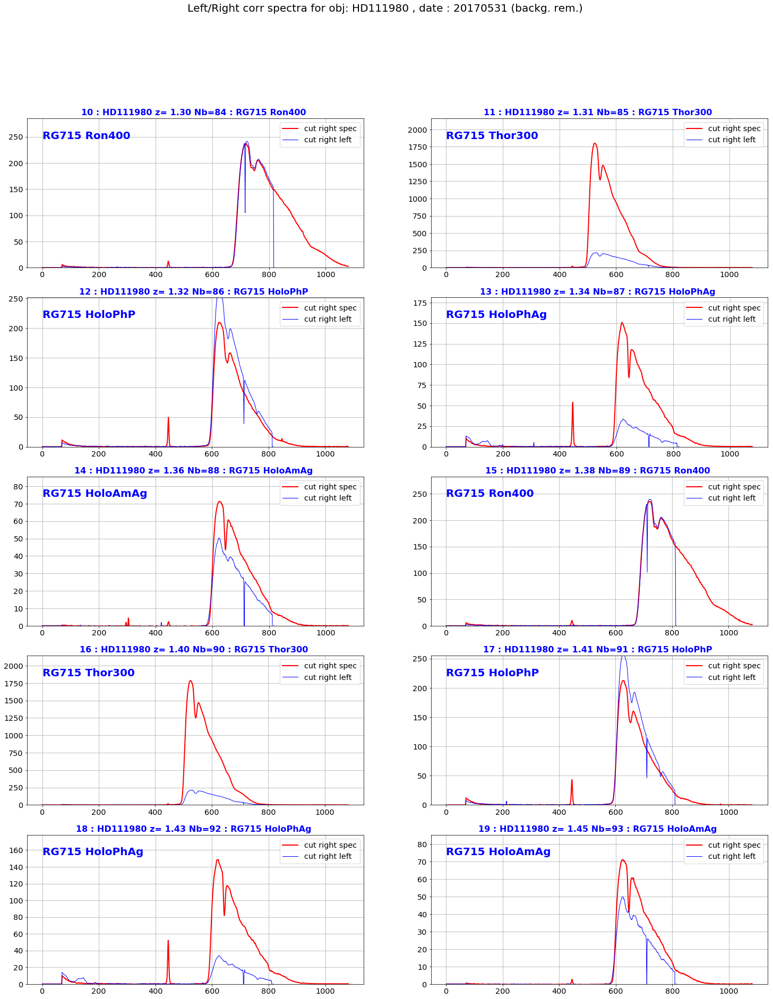

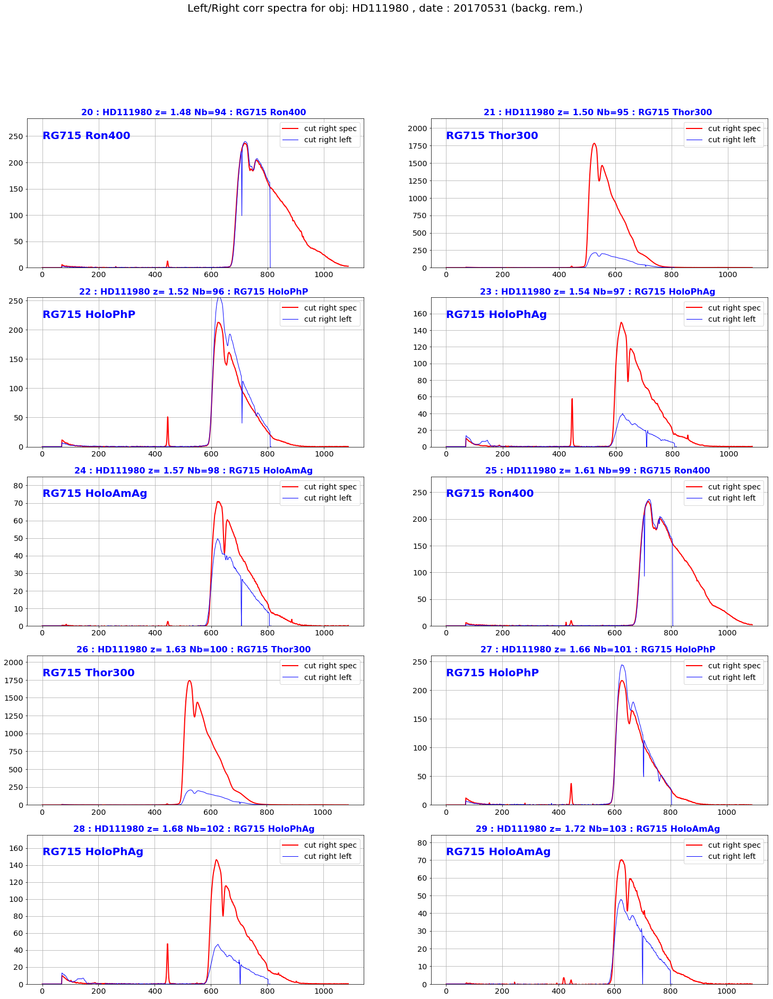

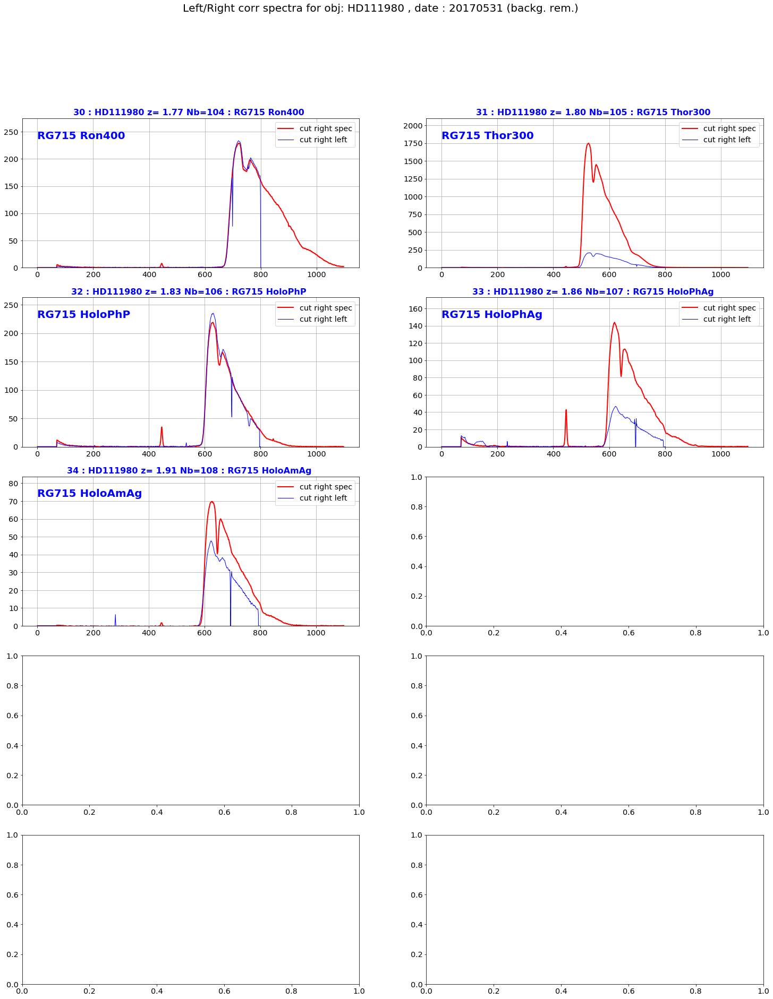

In [44]:
spectra_left_final,spectra_right_final=SplitSpectrumProfileSimpleinPDF(thecorrspectra,star_indexes_fitmean,all_titles,object_name,dir_top_images,all_filt,date,'split_spectra_nobg.pdf')

## Split background with no background subtracted

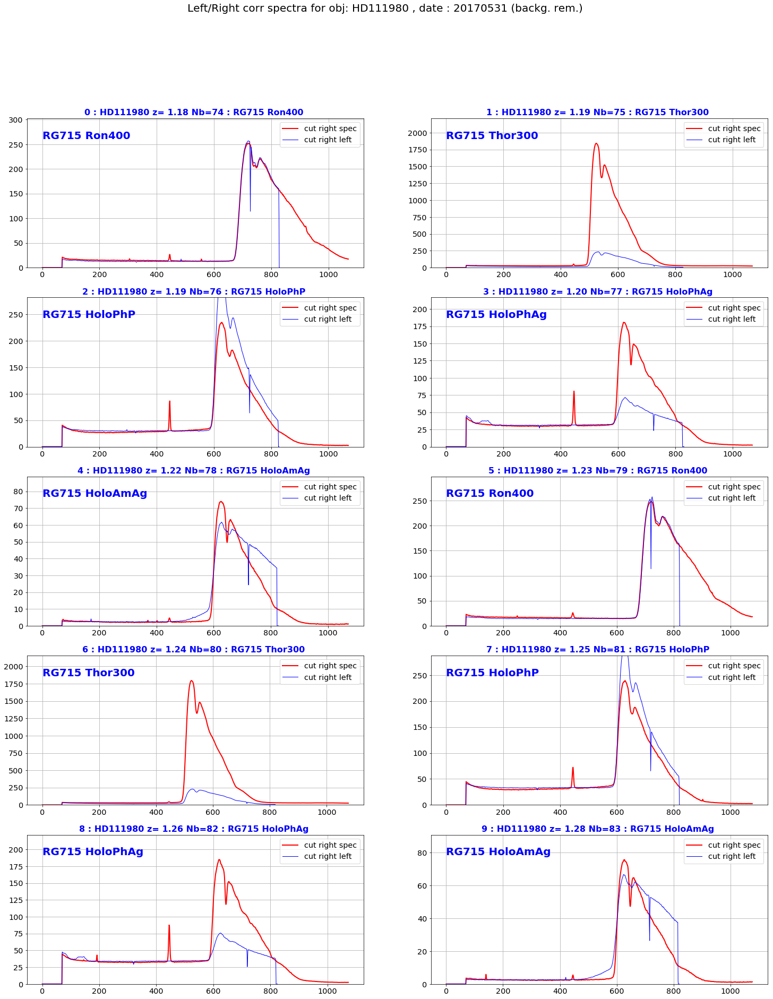

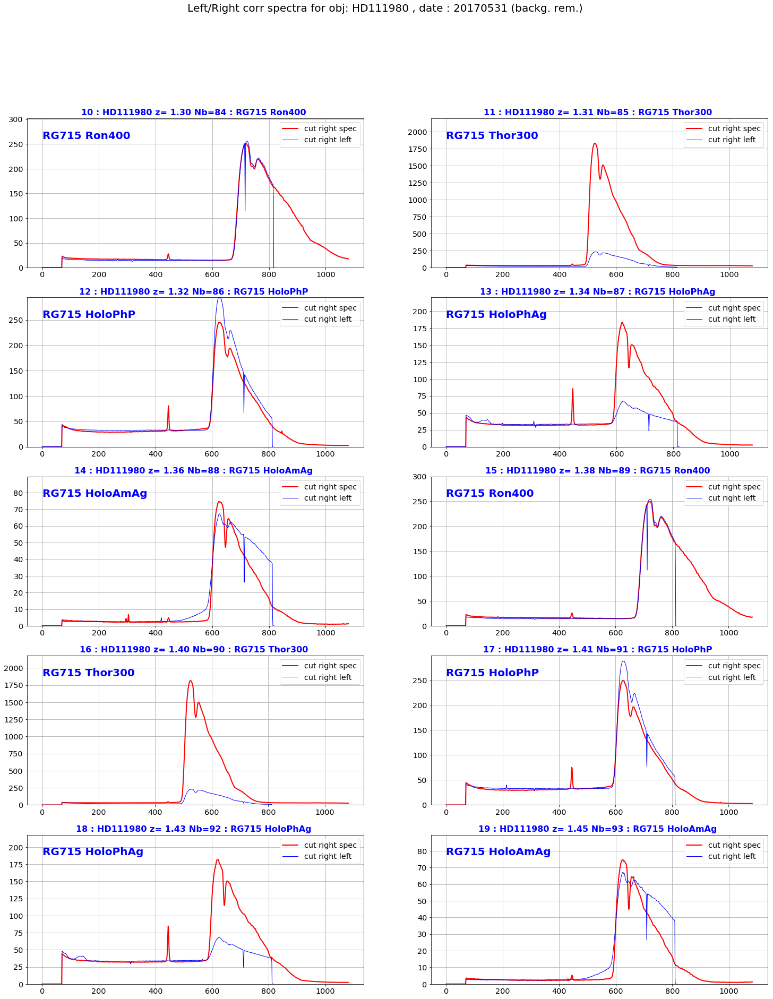

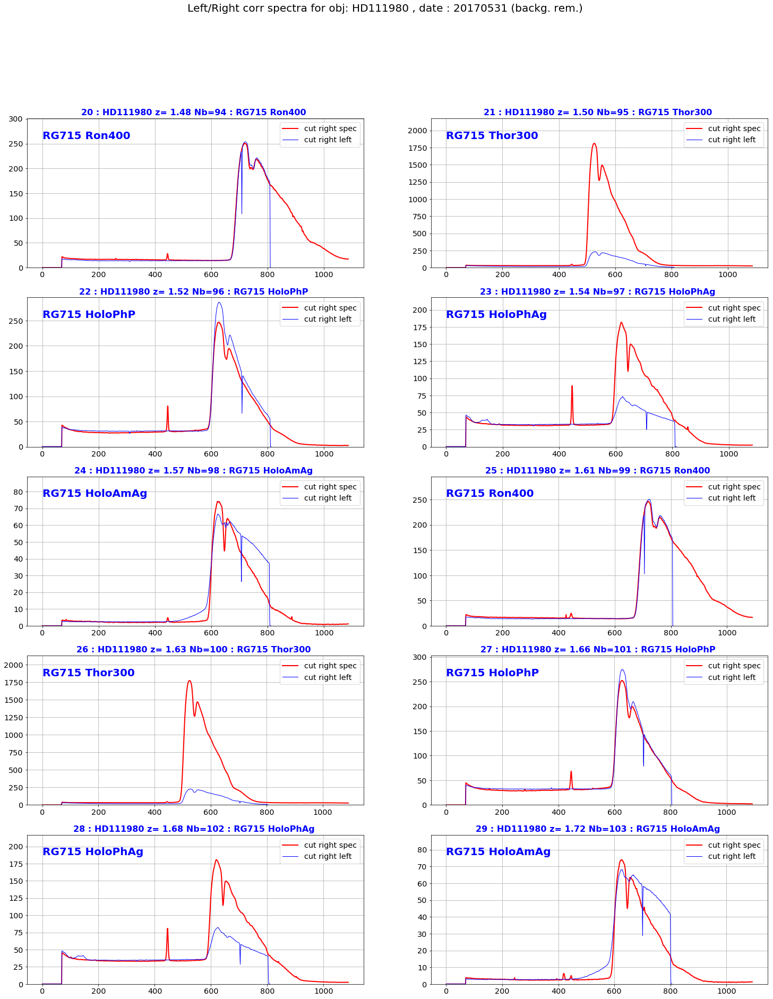

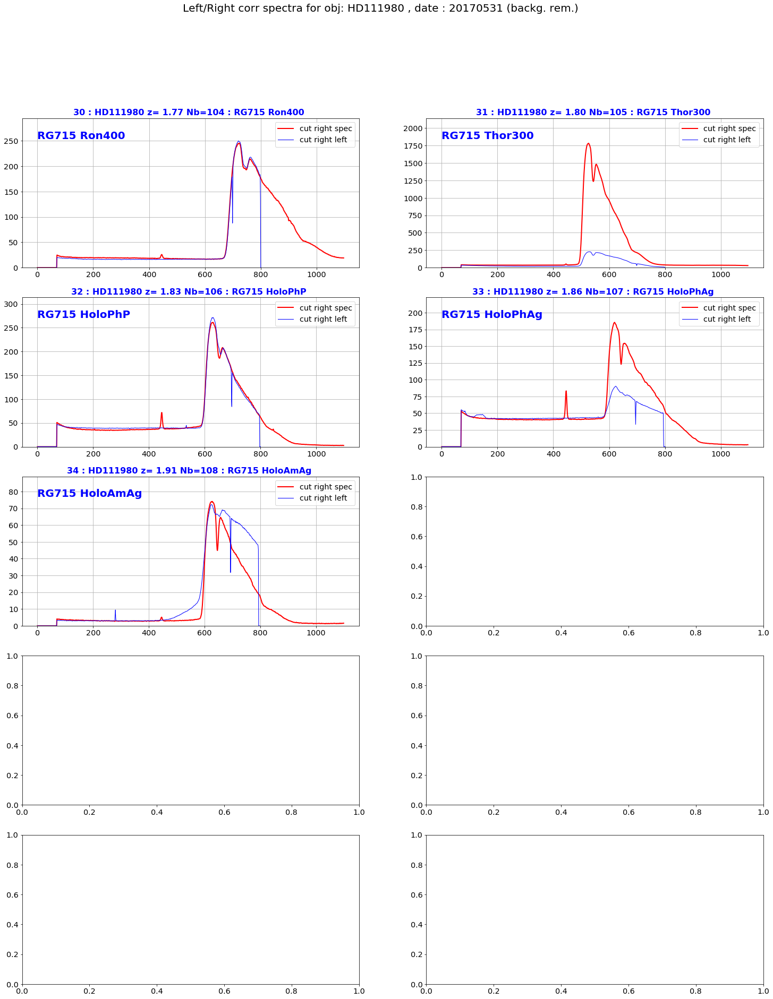

In [45]:
totalspectra_left_final,totalspectra_right_final=SplitSpectrumProfileSimpleinPDF(thespectra,star_indexes_fitmean,all_titles,object_name,dir_top_images,all_filt,date,'split_spectra_andbg.pdf')

# Superpositions of Spectra

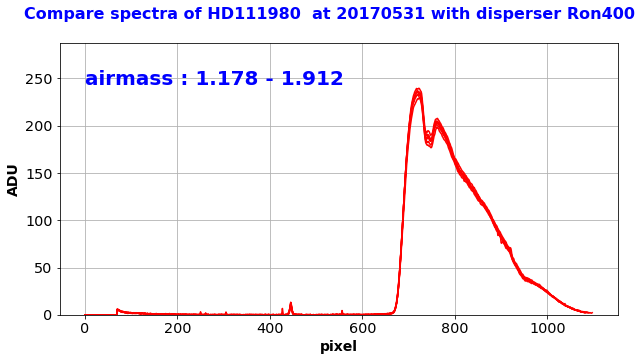

In [46]:
if filt0_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_ron400.pdf','Ron400',filt0_idx)

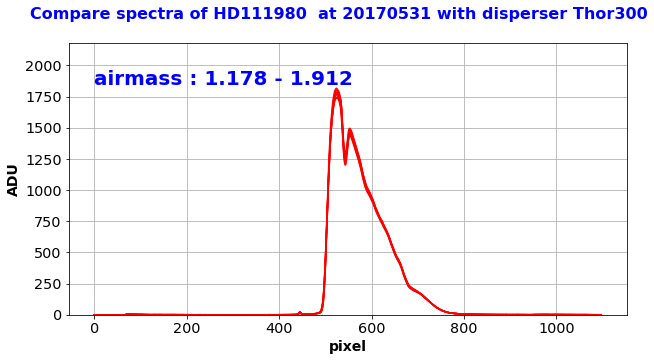

In [47]:
if filt1_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_thor300.pdf','Thor300',filt1_idx)

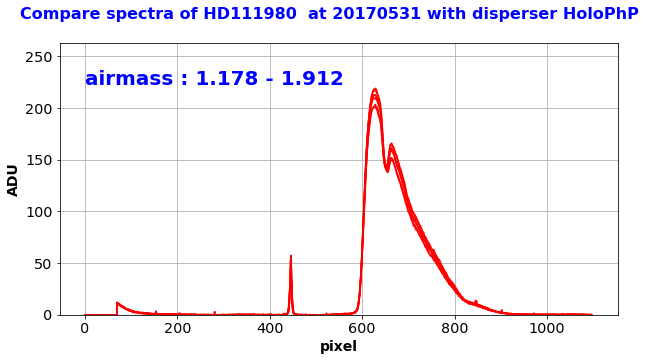

In [48]:
if filt2_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_holophp.pdf','HoloPhP',filt2_idx)

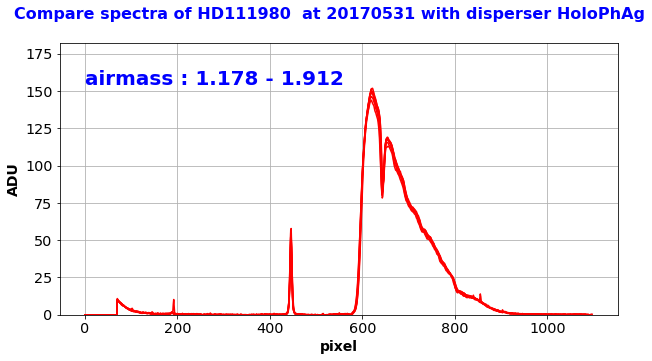

In [49]:
if filt3_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_holophag.pdf','HoloPhAg',filt3_idx)

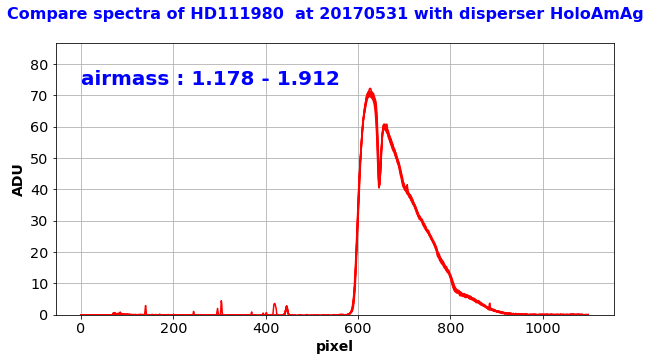

In [50]:
if filt4_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_holoamag.pdf','HoloAmAg',filt4_idx)

In [51]:
if filt5_idx.shape[0] >0:
    CompareSpectrumProfileinPDF(spectra_right_final,all_airmass,all_titles,object_name,dir_top_images,all_filt,date,'comparespec_ron200.pdf','Ron200',filt5_idx)

## Save results

In [52]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [53]:
newfullfilenames

['./spectrum_fitsspec/finalSpectra_20170531_074.fits',
 './spectrum_fitsspec/finalSpectra_20170531_075.fits',
 './spectrum_fitsspec/finalSpectra_20170531_076.fits',
 './spectrum_fitsspec/finalSpectra_20170531_077.fits',
 './spectrum_fitsspec/finalSpectra_20170531_078.fits',
 './spectrum_fitsspec/finalSpectra_20170531_079.fits',
 './spectrum_fitsspec/finalSpectra_20170531_080.fits',
 './spectrum_fitsspec/finalSpectra_20170531_081.fits',
 './spectrum_fitsspec/finalSpectra_20170531_082.fits',
 './spectrum_fitsspec/finalSpectra_20170531_083.fits',
 './spectrum_fitsspec/finalSpectra_20170531_084.fits',
 './spectrum_fitsspec/finalSpectra_20170531_085.fits',
 './spectrum_fitsspec/finalSpectra_20170531_086.fits',
 './spectrum_fitsspec/finalSpectra_20170531_087.fits',
 './spectrum_fitsspec/finalSpectra_20170531_088.fits',
 './spectrum_fitsspec/finalSpectra_20170531_089.fits',
 './spectrum_fitsspec/finalSpectra_20170531_090.fits',
 './spectrum_fitsspec/finalSpectra_20170531_091.fits',
 './spectr

### Save outputfilename

In [54]:
#
#  New fashion to save a binary table outside the primary header
#
for idx,file in np.ndenumerate(newfullfilenames):
    primhdu = fits.PrimaryHDU(header=all_header[idx[0]])   # make an primary HDU without data
    
    col1=fits.Column(name='RawLeftSpec',format='E',array=spectra_left_final[idx[0]])
    col2=fits.Column(name='RawRightSpec',format='E',array=spectra_right_final[idx[0]])
    col3=fits.Column(name='TotLeftSpec',format='E',array=totalspectra_left_final[idx[0]])
    col4=fits.Column(name='TotRightSpec',format='E',array=totalspectra_right_final[idx[0]])
    cols=fits.ColDefs([col1,col2,col3,col4])
    
    tbhdu = fits.BinTableHDU.from_columns(cols)     # new binary table HDU
    thdulist = fits.HDUList([primhdu, tbhdu])
    
    thdulist.writeto(file,overwrite=True)